# 📊 **Predictive Absenteeism Model Testing**

The **ML_Absenteeism_MU_Grouped** dataset and **SQL query** provide an **aggregated view of absenteeism data**, derived from the **same data source and department** used in the first analysis. 

To **avoid data leakage** during **rolling** and **shifting calculations**, **data modeling preparation** is handled via **SQL Server**, ensuring robust feature engineering for time-series analysis.

Below is the structured review of the dataset, query, and analytical workflow:

---

## 📋 **Dataset Overview**

### 🔑 **1. Key Features:**

#### 📅 **Date Columns:**
- **Date:** Represents the day for each record, used for **grouping** and **trend analysis**.

#### 🗂️ **Categorical Features:**
1. **AssignedDep:** Identifies the **assigned department**.
2. **MU_Name:** Management Unit name (e.g., **WESTERN UNION**, **Mercedes Benz**).
3. **Country:** Includes **'Greece'** by default if missing.
4. **Is_Actual:** Indicates whether the data point is **actual** or **forecasted**.
5. **Is_Strike:** Flags if there was a **strike** on the date.

#### 🔢 **Numerical Features:**
- **Time and Effort Measures:** 
  - **Scheduled**, **Worked**, **Overtime**, **Training**, **Vacation**, **Sick**, and **Absence**.
- **Performance Metrics:** 
  - **Early**, **Late**, and **Total_Lost**.

---

### 🧮 **2. Derived Features:**

- **Waha%:** Proportion of **WAHA (Work-At-Home Agents)**.
- **Strike_Participant%:** Proportion of **participants in strikes**.

#### 🔄 **Rolling Metrics:**
- **Rolling calculations** over the last **7** and **14 days** for key metrics like:
  - **Scheduled**, **Worked**, and **Absence**.
- **Average** and **lagged values** for rolling windows.

#### 📊 **Aggregates:**
- **HC_Weight:** Weighted **headcount metric** based on HC.
- **AVG_\***: Average metrics for various measures like **Scheduled** and **Worked**.

---

## ⚙️ **SQL Query Analysis**

### 🗂️ **1. Query Logic:**

#### 🏗️ **Data Preparation (prep CTE):**
1. **Fetches** the base dataset from the **`vScheduleV3_Static`** table.
2. Performs **initial transformations**, including:
   - Generating **`Is_Actual`** based on **date comparison**.
   - Calculating **derived fields** like **Waha**, **Is_Strike**, and **Absence**.
   - Ensuring **default values** for null entries in numerical fields using **`COALESCE`**.

#### 🔄 **Aggregation and Rolling Calculations:**
- **Groups data** by **Date**, **MU_Name**, and other key features.
- **Computes:**
  - **Rolling sums and averages** over **7** and **14 days** for key measures.
  - **Lagged metrics** over **7** and **14 days** to capture **temporal trends**.

#### 🎯 **Final Selection:**
- Includes both **raw** and **derived metrics** for **downstream analysis**.

---

### 🔍 **2. Purpose of Rolling and Lagged Metrics:**

- **Rolling Metrics:**  
  Provide insight into **short-term trends** and **variability** in absenteeism and other measures.

- **Lagged Metrics:**  
  Capture **delayed effects** of absenteeism-related factors, improving **predictability**.

---

## 📈 **Analytical Workflow**

### 📊 **1. Dataset Review:**
- Evaluate the **aggregated dataset structure**:
  - Ensure key metrics (**Scheduled**, **Worked**, **Absence**, etc.) align with **business objectives**.
  - Verify **rolling** and **lagged values** for **consistency**.

### 📉 **2. Correlation Analysis:**
- Similar to the first analysis, apply **Pearson** and **Spearman correlation coefficients** to identify:
  - **Strong relationships** between features (e.g., **Scheduled** vs. **Worked**).
  - **Associations** of **rolling** and **lagged metrics** with the **target variable** (**Absence**).

### 📊 **3. Feature Selection:**
- Assess which features (e.g., **rolling averages**, **lagged values**) improve **model performance**.
- Identify and **remove redundant features** to avoid **multicollinearity**.

### 🧪 **4. Model Experimentation:**
- Use the **aggregated dataset** for **training** and **testing predictive models**.
- Compare model performance **with and without** **rolling** and **lagged metrics** to validate their utility.

---

## 💡 **Example Insights**

### 📊 **1. WAHA% and Strike_Participant%:**
- Understanding how **WAHA** and **strike participation** influence absenteeism can guide **policy adjustments**.

### 🔄 **2. Rolling and Lagged Metrics:**
- Metrics like:
  - **`Rolling_Last_7_Days_Scheduled_Hours`**
  - **`lag7_Absence_Hours`**  
  Can reveal patterns that **static features** might miss.

### 📅 **3. Seasonal Trends:**
- **Aggregated data** helps explore **seasonality** in absenteeism across different **management units** (**MU_Name**).

---

> 🚀 **Final Thought:**  
By leveraging **SQL Server** for data preparation, we ensure that **rolling** and **lagged calculations** are **robust**, reducing the risk of **data leakage** and enhancing the **predictive power** of our models. 📈


In [38]:

import pandas as pd
import numpy as np
import random
import pylab as pl
import time
import datetime
from sklearn.feature_selection import RFECV

# for plotting
import matplotlib.pyplot as plt
import shap
import seaborn as sns
import scipy.stats as stats
from scipy.stats import chi2_contingency
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.seasonal import seasonal_decompose
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
# scikit learning packages
from lightgbm import LGBMRegressor, early_stopping
from xgboost import XGBClassifier
from sklearn.model_selection import TimeSeriesSplit
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.feature_selection import RFE, SelectFromModel
from sklearn.neighbors import KNeighborsClassifier
from sklearn.dummy import DummyRegressor
from sklearn.base import clone, BaseEstimator, TransformerMixin
from sklearn.model_selection import (
    train_test_split,
    cross_val_score,
    cross_val_predict,
    KFold,
    StratifiedKFold,
    GridSearchCV,
    RandomizedSearchCV
)
from sklearn.ensemble import (
    RandomForestClassifier,
    RandomForestRegressor,
    GradientBoostingRegressor,
    GradientBoostingClassifier,
    AdaBoostClassifier,
    ExtraTreesClassifier,
    VotingClassifier,
    VotingRegressor
)
from sklearn.metrics import (
    confusion_matrix,
    accuracy_score,
    mean_absolute_error,
    mean_squared_error,
    r2_score,
    make_scorer,
    classification_report,
    roc_curve,
    auc
)
from sklearn.preprocessing import (
    LabelEncoder,
    MinMaxScaler,
    StandardScaler,
    OneHotEncoder,
    PolynomialFeatures,
    scale
)
from sklearn.naive_bayes import GaussianNB, BernoulliNB, MultinomialNB
from sklearn.decomposition import PCA, FactorAnalysis
from sklearn.linear_model import (
    LinearRegression,
    Ridge,
    LogisticRegressionCV,
    LogisticRegression
)
from sklearn.svm import SVC
from sklearn import svm, metrics, tree
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.multiclass import OneVsRestClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.neural_network import MLPClassifier
from sklearn.utils import resample, shuffle

from collections import Counter
from pandas.api.types import is_numeric_dtype
import holidays
import warnings
from scipy.stats.mstats import mquantiles
from scipy.stats import skew
from scipy.stats import randint, uniform
import lightgbm as lgb
import logging


warnings.filterwarnings("ignore")
cmap = sns.color_palette('Blues_r')

logging.getLogger("lightgbm").setLevel(logging.CRITICAL)

###################################
starting_time = time.perf_counter()
print('')
print('starting time: ', datetime.datetime.now().strftime("%H:%M:%S"))
print('')
###################################

### Read the file
# df_raw = pd.read_excel(r"ML_Absenteism_MU_Grouped_Mercedes.xlsx")
df_raw = pd.read_excel(r"C:\Users\oslu.5\Desktop\ML test\ML_Absenteism_MU_Grouped_Mercedes.xlsx")
##########
ending_time = time.perf_counter()
total_in_sec = ending_time-starting_time
print("Data time in sec")
print(total_in_sec)
print("Data uploaded")


starting time:  16:51:58

Data time in sec
77.53381479999734
Data uploaded


In [39]:
###################################
starting_time = time.perf_counter()
print('')
print('starting time: ', datetime.datetime.now().strftime("%H:%M:%S"))
print('')
###################################

df = df_raw.copy()
df = df[df['Is_Actual']=='Actual']
# -----------------------
# Drop Duplicates
# -----------------------
df = df.drop_duplicates(subset=['MU_Name','Date'], keep='first')


df['Country'] = df['Country'].str.replace('Unknown','Greece')

df = df.sort_values(by=['Date','MU_Name']).reset_index(drop=True)

df['AssignedDep'] = df['AssignedDep'].astype(int).astype(str)


Country_dic = {'External':'Greece',
               'Czech Republic':'CZ',
               'Suriname':'ZA',
               'South Africa':'ZA',
               'United Kingdom':'GB'}
df['Country'] = df['Country'].replace(Country_dic)

# Generate the dictionary by passing each unique country name to holidays.country_holidays
country_to_code = {}

for country in df['Country'].unique():
    try:
        iso_code = holidays.country_holidays(country=country).country
        country_to_code[country] = iso_code
    except Exception as e:
        print(f"Error for country: {country} - {e}")

# Function to check if a date is a holiday
def is_holiday(row):
    country_code = country_to_code.get(row['Country'])
    if country_code:
        try:
            country_holidays = holidays.country_holidays(country=country_code, years=row['Date'].year)
            return 1 if row['Date'] in country_holidays else 0
        except Exception as e:
            print(f"Error checking holiday for {row['Country']} on {row['Date']}: {e}")
    return 0

# Apply the function to create the Is_Holiday column
df['Is_Holiday'] = df.apply(is_holiday, axis=1)

### Create extra Date columns 

# Step 7: Convert 'Date' to datetime and set index
df['Date'] = pd.to_datetime(df['Date'])
df['Season'] = (df['Date'].dt.month % 12 + 3) // 3
df = df.set_index('Date')

# Step 8: Overwrite columns based on index
df['Year'] = df.index.year
df['Month'] = df.index.month
df['DayofMonth'] = df.index.day
df['DayofWeek'] = df.index.dayofweek  # Monday=0, Sunday=6
df['WeekofYear'] = df.index.isocalendar().week




df['Month_sin'] = np.sin(2 * np.pi * df['Month'] / 12)
df['Month_cos'] = np.cos(2 * np.pi * df['Month'] / 12)
df['DayofWeek_sin'] = np.sin(2 * np.pi * df['DayofWeek'] / 7)
df['DayofWeek_cos'] = np.cos(2 * np.pi * df['DayofWeek'] / 7)
df['DayofMonth_sin'] = np.sin(2 * np.pi * df['DayofMonth'] / 31)
df['DayofMonth_cos'] = np.cos(2 * np.pi * df['DayofMonth'] / 31)

# Step 1: Encoding MU_Name with cat.codes and appending '_Cat'
df['MU_Name_Cat'] = df['MU_Name'].astype('category').cat.codes

df_mus = df[['MU_Name_Cat','MU_Name']].drop_duplicates(keep='first').reset_index(drop=True)
# Step 2: One-hot encoding with pd.get_dummies and renaming columns with '_Cat'
df_dummies = pd.get_dummies(df['MU_Name_Cat'], prefix='MU_Name')
# Step 3: Concatenating the encoded columns back to the original dataframe
df = pd.concat([df, df_dummies], axis=1)


df['Country_Cat'] = df['Country'].astype('category').cat.codes

df_Country = df[['Country_Cat','Country']].drop_duplicates(keep='first').reset_index(drop=True)
# Step 2: One-hot encoding with pd.get_dummies and renaming columns with '_Cat'
df_dummies = pd.get_dummies(df['Country_Cat'], prefix='Country')
# Step 3: Concatenating the encoded columns back to the original dataframe
df = pd.concat([df, df_dummies], axis=1)

# Step 4: Drop the original categorical column if needed
df.drop(columns=['MU_Name','Country','AssignedDep','Is_Actual'], inplace=True)


#######



##########
ending_time = time.perf_counter()
total_in_sec = ending_time-starting_time
print("\n Data time in sec")
print(total_in_sec)
print("Data Cleaning Completed")


starting time:  16:53:15


 Data time in sec
10.056412699999782
Data Cleaning Completed


# **Why Use Sin-Cos Transformation for Cyclical Columns?**

Cyclical features like Month, DayofWeek, and DayofMonth represent repeating patterns. 
Encoding them as integers (e.g., January = 1, December = 12) fails to capture their cyclic nature, where December and January are close.
________________________________________

![Image2](Image2.png)
________________________________________
## **Why It’s Important**
1.	Preserves Cyclicality:
-	Ensures the model understands repeating patterns (e.g., seasonality in months).
2.	Avoids Misleading Distances:
-	Prevents the model from treating December and January as far apart.
3.	Improves Model Performance:
-	Captures seasonal and periodic trends more effectively.


In [41]:
passthrough_cols =['Year',
 'Month',
 'WeekofYear',
 'DayofMonth',
 'DayofWeek',
 'Season',
 'Is_Strike',
 'Is_Holiday']


## Target Columns
target_col = ['Total_Lost']
### passthrough_cols
encoded_cols = df.columns[(df.columns.str.contains('MU_Name'))
                         |(df.columns.str.contains('Country'))].tolist()
passthrough_cols = passthrough_cols + encoded_cols

numeric_cols = df.columns.difference(target_col + passthrough_cols).tolist()
feature_cols = passthrough_cols+ numeric_cols 
feature_cols_all = feature_cols+target_col

df = df[feature_cols_all]
df.dropna(axis=0, how='any', inplace=True)

# Display the result
print("Passthrough Columns:", len(passthrough_cols))
print("Numeric Columns:", len(numeric_cols))
print("Feature Columns:", len(feature_cols))
print("All Feature Columns (with target):", len(feature_cols_all))

# Find the max date where Is_Actual is 'Actual'
max_actual_date = df.index.max()
print(f'Sample Data Starting from {df.index.min()} until {max_actual_date}')

Passthrough Columns: 66
Numeric Columns: 164
Feature Columns: 230
All Feature Columns (with target): 231
Sample Data Starting from 2023-01-15 00:00:00 until 2025-02-06 00:00:00


# Exploratory data analysis

# Analysis of the Skewness Results

### General Insights from the Skewness Values:

##### Highly Skewed Features (|Skewness| > 1):

Features with a skewness greater than 1 or less than -1 indicate a highly skewed distribution, meaning the data is not symmetric and could benefit from log transformation.

#####  Positively skewed: Long right tail → candidates for log transformation.

##### Negatively skewed: Long left tail → might consider transformations like power or square root transformation instead.

#####  Moderately Skewed Features (0.5 < |Skewness| ≤ 1):

These features show moderate skewness and could benefit from a transformation in some cases, but it is not always necessary.

##### Symmetric Features (|Skewness| ≤ 0.5):

These features are approximately symmetric and do not require any transformation.

In [42]:
def get_skewed_columns(data, numeric_columns, threshold=1.0):
    """
    Identify numeric columns with skewness above the specified threshold.
    Parameters:
    data (DataFrame): The DataFrame containing numeric columns.
    numeric_columns (list): List of numeric column names to check.
    threshold (float): Skewness threshold to determine highly skewed columns.

    Returns:
    list: Columns and their skewness values sorted by skewness strength.
    """
    skewed_cols = []

    for col in numeric_columns:
        skewness = skew(data[col].dropna())  # Drop missing values to avoid errors
        if abs(skewness) > threshold:
            skewed_cols.append((col, skewness))  # Append column and its skewness

    # Sort the skewed columns by absolute skewness strength in descending order
    skewed_cols = sorted(skewed_cols, key=lambda x: abs(x[1]), reverse=True)

    # Print the skewness values of the sorted columns
    for col, skewness in skewed_cols:
        print(f'Skewness of {col}: {skewness:.2f}')

    # Return only the column names
    return [col for col, _ in skewed_cols]

# Example usage with threshold of 1.0 (highly skewed data)
columns_to_log_transform = get_skewed_columns(df, numeric_cols, threshold=1.0)




Skewness of Strike_Participant%: 35.81
Skewness of lag14_AVG_Late_Hours: 21.06
Skewness of lag7_AVG_Late_Hours: 20.93
Skewness of lag14_AVG_Late%: 20.29
Skewness of lag7_AVG_Late%: 20.19
Skewness of lag14_Late%: 15.38
Skewness of lag7_Late%: 15.33
Skewness of lag14_AVG_Early%: 14.04
Skewness of lag7_AVG_Early%: 13.34
Skewness of lag7_Training_HC: 12.13
Skewness of lag14_Training_HC: 11.93
Skewness of lag14_Early%: 11.55
Skewness of lag7_Early%: 11.30
Skewness of lag14_AVG_Absence_Hours: 9.07
Skewness of lag14_AVG_Early_Hours: 9.07
Skewness of lag7_AVG_Absence_Hours: 9.05
Skewness of lag7_AVG_Early_Hours: 9.05
Skewness of lag14_Absence_HC: 8.50
Skewness of lag7_Absence_HC: 8.48
Skewness of lag14_Absence_Hours: 8.40
Skewness of lag7_Absence_Hours: 8.38
Skewness of lag14_AVG_Sick_Hours: 8.36
Skewness of lag7_AVG_Sick_Hours: 8.36
Skewness of lag14_AVG_Absence%: 8.28
Skewness of lag7_AVG_Absence%: 8.22
Skewness of lag14_AVG_TotalLost_Hours: 8.14
Skewness of lag14_AVG_Total_Lost%: 8.13
Skewn

In [43]:
print(
    f"\nNumber of Columns selected for log transformation: {len(columns_to_log_transform)} "
    f"({(len(columns_to_log_transform) / len(numeric_cols)) * 100:.2f}%)")


Number of Columns selected for log transformation: 150 (91.46%)


# Columns Recommended for Log Transformation:

In [44]:
def log_transform(data, to_log):
    X = data.copy()
    for item in to_log:
        # Ensure all values are positive to avoid log-related errors
        X[item] = np.where(X[item] > 0, np.log1p(X[item]), 0)
        
        # Replace potential infinities with NaNs and drop them
        X[item].replace([np.inf, -np.inf], np.nan, inplace=True)
        X[item].fillna(0, inplace=True)  # Replace NaNs with 0 (or another strategy)
        
    return X
##
# Apply the log transform safely
df_log = log_transform(df, columns_to_log_transform)

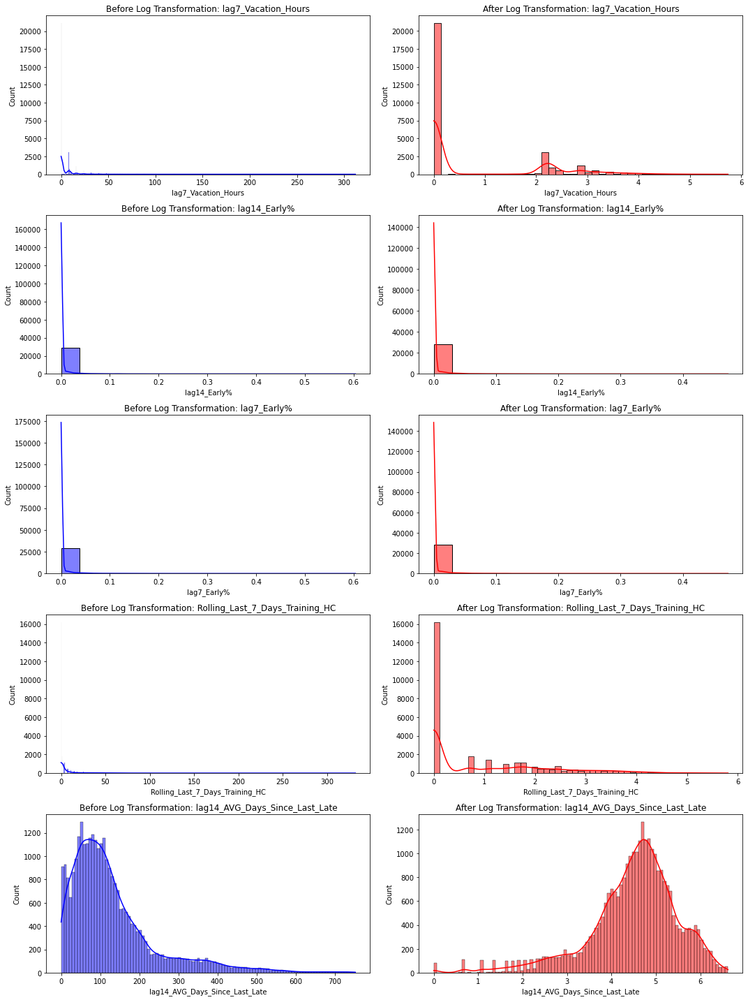

In [12]:
# Randomly select 10 columns from columns_to_log_transform
random_columns_to_log_transform = random.sample(columns_to_log_transform, min(5, len(columns_to_log_transform)))

# Set figure size based on the number of randomly selected columns
plt.figure(figsize=(15, len(random_columns_to_log_transform) * 4))

# Loop through each randomly selected column to visualize before and after transformation
for i, col in enumerate(random_columns_to_log_transform):
    plt.subplot(len(random_columns_to_log_transform), 2, 2 * i + 1)
    sns.histplot(df[col], kde=True, color='blue')
    plt.title(f'Before Log Transformation: {col}')

    plt.subplot(len(random_columns_to_log_transform), 2, 2 * i + 2)
    sns.histplot(df_log[col], kde=True, color='red')
    plt.title(f'After Log Transformation: {col}')

plt.tight_layout()
plt.show()

# Initial Train ,Valid ,Test Split with EDA

In [45]:
# Calculate the boundaries
df = df_log.sort_index()  # ensure it's time-sorted if needed
dftrain = df.copy()

start_date = df.index.min()
end_date = df.index.max()

# Total duration in days
total_days = (end_date - start_date).days

# Calculate the boundaries
train_end_date = start_date + pd.Timedelta(days=int(0.7 * total_days))
valid_end_date = train_end_date + pd.Timedelta(days=int(0.15 * total_days))

# Split the dataset
train_df = df[df.index <= train_end_date]
valid_df = df[(df.index > train_end_date) & (df.index <= valid_end_date)]
test_df = df[df.index > valid_end_date]

####
print(f'Number of Pass through Columns {len(passthrough_cols)}')
print(f'Number of numerical {len(numeric_cols)}')
print(f'Number of target_col {len(target_col)}')
print(f'Number of feature_cols_all {len(feature_cols_all)}')

# Split train and test
train = train_df.copy()
valid = valid_df.copy()
test = test_df.copy()


####
print(f'\nNumber of rows in train {len(train)}')
print(f'Number of rows in test {len(test)}')
print(f'Number of rows in valid {len(valid)}')



# # Train-test split
# Step 3: Train-test split based on the index to avoid data leakage
X_train, X_valid, X_test = train[feature_cols], valid[feature_cols], test[feature_cols]
y_train, y_valid, y_test = train[target_col].values.ravel(), valid[target_col].values.ravel(), test[target_col].values.ravel()


print('Performance of Base Random Forest Model')
print(f'\nNumber of rows in X_train {len(X_train)}')
print(f'Number of rows in X_test {len(X_test)}')
print(f'Number of rows in X_valid {len(X_valid)}')
print(f'Number of rows in y_train {len(y_train)}')
print(f'Number of rows in y_valid {len(y_valid)}')
print(f'Number of rows in y_test {len(y_test)}')

Number of Pass through Columns 66
Number of numerical 164
Number of target_col 1
Number of feature_cols_all 231

Number of rows in train 19300
Number of rows in test 4970
Number of rows in valid 5099
Performance of Base Random Forest Model

Number of rows in X_train 19300
Number of rows in X_test 4970
Number of rows in X_valid 5099
Number of rows in y_train 19300
Number of rows in y_valid 5099
Number of rows in y_test 4970


# Create a Base model to Check Features

In [9]:


# Preprocessing pipeline
preprocessor = ColumnTransformer(
    transformers=[
        ('numeric_cols', StandardScaler(), numeric_cols),  # Scale only numerical columns excluding dates
        ('passthrough', 'passthrough', passthrough_cols)  # Pass through the date columns without transformation
    ]
)

# Define the model
rf = RandomForestRegressor(n_estimators=200
                           , max_depth=20
                           , min_samples_split=2
                           , min_samples_leaf=1
                           , random_state=42)




# Create a pipeline
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', rf)
])

# Train the model
pipeline.fit(X_train, y_train)

# Evaluate on Validation Set
y_valid_pred = pipeline.predict(X_valid)
mse_valid = mean_squared_error(y_valid, y_valid_pred)
r2_valid = r2_score(y_valid, y_valid_pred)
mae_valid = mean_absolute_error(y_valid, y_valid_pred)
rmse_valid = np.sqrt(mse_valid)

print('Validation Performance of Base Random Forest Model:')
print(f'R-squared (R2): {r2_valid:.4f}')
print(f'MSE: {mse_valid:.4f}')
print(f'MAE: {mae_valid:.4f}')
print(f'RMSE: {rmse_valid:.4f}')


# Final evaluation on Test Set
y_test_pred = pipeline.predict(X_test)
mse_test = mean_squared_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)
mae_test = mean_absolute_error(y_test, y_test_pred)
rmse_test = np.sqrt(mse_test)

# Print evaluation metrics
print('Test Performance of Base Random Forest Model')
print('Random Forest R-squared (R2) score: {:.4f}'.format(r2_test))
print('Random Forest Mean Squared Error (MSE): {:.4f}'.format(mse_test))
print('Random Forest Mean Absolute Error (MAE): {:.4f}'.format(mae_test))
print('Random Forest Root Mean Squared Error (RMSE): {:.4f}'.format(rmse_test))


# Extract feature importances from the Random Forest model
importances = pipeline.named_steps['model'].feature_importances_

# This ensures correct mapping of features
feature_names = numeric_cols + passthrough_cols

# Ensure the length matches
assert len(feature_names) == len(importances), "Mismatch between feature names and importances."

# Create a DataFrame for feature importances
feature_importances = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
})

# Sort feature importances in descending order
feature_importances = feature_importances.sort_values(by='Importance', ascending=False)


# Display top 10 feature importances
print("\nTop 10 Feature Importances:")
print(feature_importances.head(10))

Validation Performance of Base Random Forest Model:
R-squared (R2): 0.7632
MSE: 21.0019
MAE: 2.0516
RMSE: 4.5828
Test Performance of Base Random Forest Model
Random Forest R-squared (R2) score: 0.6671
Random Forest Mean Squared Error (MSE): 13.1088
Random Forest Mean Absolute Error (MAE): 1.6658
Random Forest Root Mean Squared Error (RMSE): 3.6206

Top 10 Feature Importances:
                                  Feature  Importance
54   Rolling_Last_7_Days_Total_Lost_Hours    0.525558
66                    Strike_Participant%    0.097793
65                        Scheduled_Open%    0.038894
62                          Scheduled_HC%    0.025778
64                         Scheduled_Open    0.025068
0                     AVG_Scheduled_Hours    0.017975
52         Rolling_Last_7_Days_Sick_Hours    0.014892
45      Rolling_Last_7_Days_Absence_Hours    0.010644
151                  lag7_Scheduled_Open%    0.004938
63                        Scheduled_Hours    0.004556


# 📊 **Comments on Model Performance: Basic vs. Modeled Dataset**

---

## 🔍 **Comparison of Results**

### 1️⃣ **Basic Dataset (ML_Absenteeism):**

- **R² Score (0.368):**  
  The model explains only **36.8%** of the variance in the target variable (**Total_Lost**), indicating **limited predictive power**.
  
- **Error Metrics:**  
  1. **MSE (242.982)** and **RMSE (15.588):**  
     High error values show that **predictions deviate significantly** from the actual values.
  2. **MAE (13.931):**  
     The average prediction error is **large**, suggesting the model **struggles to identify patterns** in the basic dataset.

- **Averages:**  
  - **Average Actual Total_Lost:** **38.964**  
  - **Average Predicted Total_Lost:** **36.791**  
  This gap indicates a **systematic bias** in predictions.

- **Reason:**  
  This dataset includes only **basic features** (e.g., basic lag values), lacking **rolling metrics**, **cyclical transformations**, and other **derived features** needed to capture **temporal** and **cyclical patterns** effectively.

---

### 2️⃣ **Modeled Dataset (ML_Absenteeism_MU_Grouped):**

- **R² Score (0.6671 - Test, 0.7632 - Validation):**  
  A **significant improvement**, with **66.71%** of the variance explained on the test set and **76.32%** on the validation set.  
  This indicates that the addition of **engineered features** provides **richer insights** into the target variable.

- **Error Metrics:**  
  1. **MSE (13.1088 - Test, 21.0019 - Validation)** and **RMSE (3.6206 - Test, 4.5828 - Validation):**  
     **Substantial reduction** in errors compared to the basic dataset, reflecting **improved predictive accuracy**.
  2. **MAE (1.6658 - Test, 2.0516 - Validation):**  
     The average prediction error is **much lower**, highlighting the **effectiveness of the modeled dataset** in capturing relationships.

- **Feature Importance (Top 5 Features):**  
  1. **Rolling_Last_7_Days_Total_Lost_Hours (52.56%)**  
  2. **Strike_Participant% (9.78%)**  
  3. **Scheduled_Open% (3.89%)**  
  4. **Scheduled_HC% (2.58%)**  
  5. **Scheduled_Open (2.51%)**  

  These features emphasize the **importance of rolling** and **aggregated metrics** in driving model performance.

---

## 💡 **Key Insights**

### 🚀 **1. Impact of Feature Engineering:**

The transformation from the **basic dataset** to the **modeled dataset** (**ML_Absenteeism_MU_Grouped**) demonstrates the importance of **feature engineering**, including:

- **Rolling Metrics:**  
  Capture **short-term trends** (e.g., **Rolling_Last_7_Days_Total_Lost_Hours**).

- **Cyclical Transformations:**  
  Encode **seasonal patterns** (e.g., **DayofMonth_sin**).

- **Lagged Values:**  
  Account for **delayed effects** in absenteeism trends (e.g., **lag7_AVG_Worked_Hours**).

These features improve the model’s ability to understand **temporal** and **periodic relationships**, resulting in **better performance**.

---

### 📈 **2. Model Performance:**

- The **base model** with the **modeled dataset** achieves **higher R²** and **lower errors**, demonstrating the **critical role of preprocessing** and **feature engineering** in predictive modeling.

---

### ⚠️ **3. Basic Dataset Limitation:**

- The **basic dataset** lacks the **depth** provided by **advanced features**, leading to:
  - **Poor predictive performance**
  - **Higher errors**
  - **Systematic biases** in predictions

---

## 🚀 **Takeaways**

### ✅ **1. Feature Engineering Drives Results:**

- The **substantial improvement** from the **basic dataset** to the **modeled dataset** underscores the need for:
  - **Rolling metrics**
  - **Lagged values**
  - **Cyclical feature transformations**

- Analyzing the relationships within the **basic dataset** informed the **design** of the modeled dataset.

---

### 🔄 **2. Importance of Analysis and Iteration:**

- The process of **transforming the dataset** based on insights from **ML_Absenteeism** into **ML_Absenteeism_MU_Grouped** highlights the **iterative nature** of effective **data science workflows**.

---

### 📊 **3. Validation of Preprocessing:**

- The **improved metrics** validate that the **modeled dataset** is:
  - More **representative** of the factors influencing absenteeism
  - Better at capturing **temporal dependencies**
  - More effective in **predicting future trends**

---

> 🚀 **Final Thought:**  
The journey from a **basic dataset** to a **modeled dataset** showcases the power of **feature engineering**, **iterative analysis**, and **robust data preprocessing** in driving model performance. The results speak for themselves—**structured data** leads to **stronger models**. 📈

# Class Distribution in Total_Lost for  Zero Values vs Non Zero Values

# 🎯 **Addressing Class Imbalance with a Classification Step**

---

## ⚠️ **Why This Step?**

Our dataset shows a **severe class imbalance** in the `Total_Lost` variable:
- **Zero Total_Lost:** 72%  
- **Non-zero Total_Lost:** 28%  

This imbalance can negatively impact regression models by:
- **Biasing predictions** towards zero
- **Reducing sensitivity** to non-zero absenteeism patterns

---

## 🚀 **What Are We Aiming For?**

To tackle this, we’ve introduced a **classification step** that:
1. **Identifies** whether `Total_Lost` will be **zero or non-zero** (binary classification).
2. **Improves regression accuracy** by focusing on **predicting non-zero values** more effectively.

This approach helps the model:
- **Reduce error rates** on non-zero cases  
- **Enhance predictive power** for critical absenteeism instances  

---

> **Key Idea:**  
By treating the problem as a **hurdle model**, we first classify the likelihood of absenteeism and then predict the actual absenteeism amount for non-zero cases. This two-step method improves performance in **imbalanced datasets** like ours. 🚀

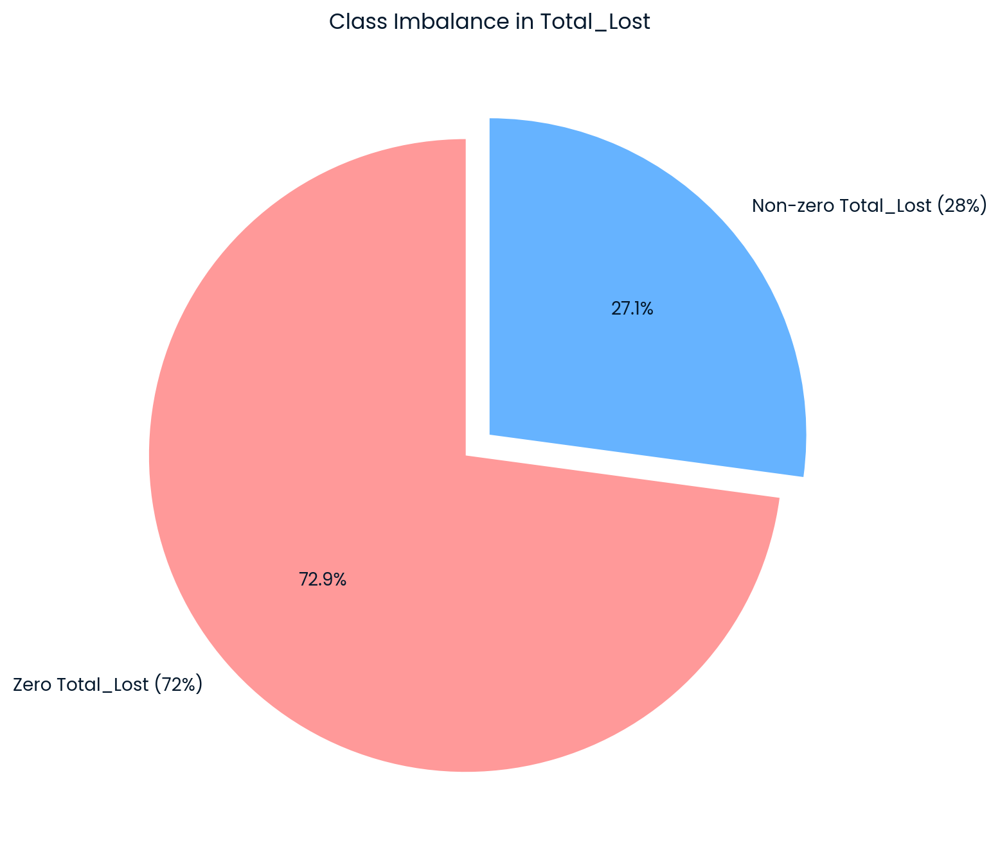

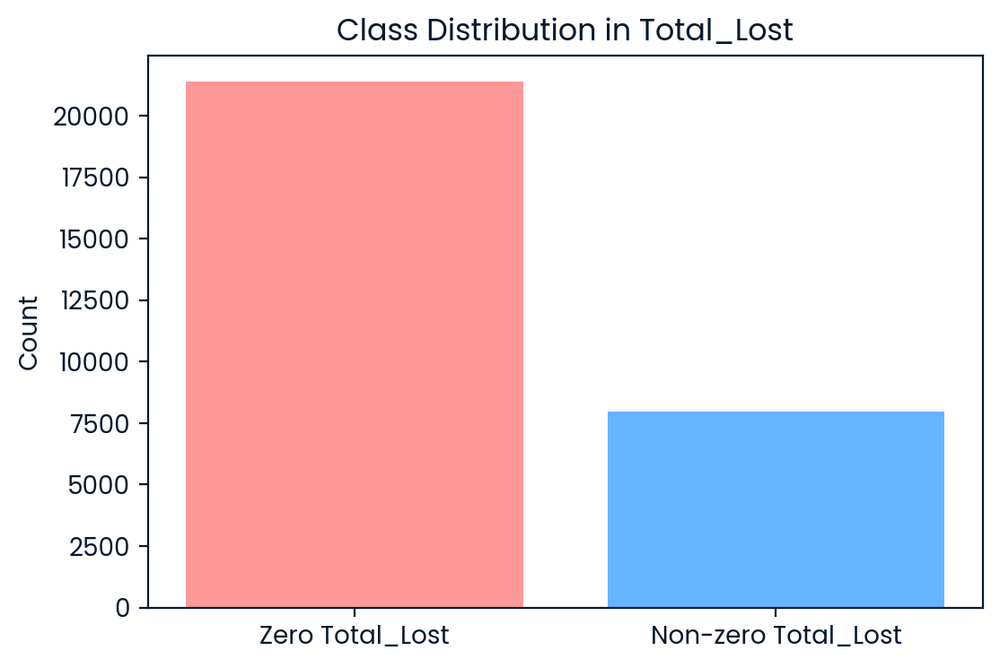

In [10]:
No_Total_Lost = (df['Total_Lost'] == 0).astype(int).sum()
Yes_Total_Lost = (df['Total_Lost'] > 0).astype(int).sum()
Total_Size = df.shape[0]

# Percentage Calculation
no_total_lost_percent = (No_Total_Lost / Total_Size) * 100
yes_total_lost_percent = (Yes_Total_Lost / Total_Size) * 100


# Pie Chart to Visualize Class Imbalance
labels = ['Zero Total_Lost (72%)', 'Non-zero Total_Lost (28%)']
sizes = [no_total_lost_percent, yes_total_lost_percent]
explode = (0.1, 0)  # Explode the first slice (Zero Total_Lost)

plt.figure(figsize=(8, 8))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90, colors=['#ff9999', '#66b3ff'], explode=explode)
plt.title('Class Imbalance in Total_Lost')
plt.show()

# Bar Chart for Class Distribution
plt.figure(figsize=(6, 4))
plt.bar(['Zero Total_Lost', 'Non-zero Total_Lost'], [No_Total_Lost, Yes_Total_Lost], color=['#ff9999', '#66b3ff'])
plt.title('Class Distribution in Total_Lost')
plt.ylabel('Count')
plt.show()

# Non Zero Total_Lost Prediction Flag Classfier

In [21]:

######################################################
# Define a transformer to ensure the input is a DataFrame
######################################################
class EnsureDataFrame(BaseEstimator, TransformerMixin):
    def __init__(self, columns):
        self.columns = columns
    def fit(self, X, y=None):
        return self
    def transform(self, X, y=None):
        # If X is not a DataFrame, create one using as many columns as available
        if not isinstance(X, pd.DataFrame):
            n_cols = X.shape[1]
            # Use the first n_cols of the expected columns
            cols = self.columns[:n_cols]
            X = pd.DataFrame(X, columns=cols)
        # Now, if any expected columns are missing, add them with NaN values.
        missing = [col for col in self.columns if col not in X.columns]
        for col in missing:
            X[col] = np.nan
        # Finally, reindex the DataFrame to ensure it has exactly self.columns in that order.
        return X[self.columns]

######################################################
# 3. Setup for Classification
######################################################
# For classification, we work with historical (labeled) data.
# Use only training data to create the classification target.
df_hurdle = train.copy()
df_hurdle['NonZeroFlag'] = (df_hurdle['Total_Lost'] > 0).astype(int)

# For evaluation purposes, ensure that valid and test sets also have the target.
if 'NonZeroFlag' not in valid.columns:
    valid['NonZeroFlag'] = (valid['Total_Lost'] > 0).astype(int)
if 'NonZeroFlag' not in test.columns:
    test['NonZeroFlag'] = (test['Total_Lost'] > 0).astype(int)

# Define the classification features: exclude the regression target and the flag.
class_feature_cols = [c for c in df_hurdle.columns if c not in ['Total_Lost', 'NonZeroFlag']]
X_train_class = df_hurdle[class_feature_cols]
y_train_class = df_hurdle['NonZeroFlag'].values

# Prepare the validation and test sets using the same features.
X_valid_class = valid[class_feature_cols]
X_test_class = test[class_feature_cols]

print("=== Data Shapes ===")
print("Train Classification:", X_train_class.shape, y_train_class.shape)
print("Valid Classification:", X_valid_class.shape)
print("Test  Classification:", X_test_class.shape)

######################################################
# 4. Define Classifiers + Random Search Distributions
######################################################
candidate_classifiers = {
    "RandomForest": (
        RandomForestClassifier(random_state=42),
        {
            "n_estimators": randint(50, 300),
            "max_depth": [None, 5, 10, 20],
            "min_samples_split": randint(2, 10),
            "min_samples_leaf": randint(1, 5)
        }
    ),
    "XGBoost": (
        XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='logloss'),
        {
            "n_estimators": randint(50, 300),
            "max_depth": randint(2, 8),
            "learning_rate": uniform(0.01, 0.3),
            "subsample": uniform(0.5, 0.5),
            "colsample_bytree": uniform(0.5, 0.5)
        }
    ),
    "LogisticRegression": (
        LogisticRegression(random_state=42, max_iter=2000),
        {
            "C": uniform(0.01, 10.0),
            "penalty": ["l2"]
        }
    )
}

# Use the same preprocessing for classification as in regression.
# (Assumes that numeric_cols and passthrough_cols are defined elsewhere.)
preprocessor_class = ColumnTransformer([
    ('numeric_cols', StandardScaler(), numeric_cols),
    ('passthrough', 'passthrough', passthrough_cols)
])

######################################################
# 5. Randomized Search -> Best Hyperparams (Adjusted for validation)
######################################################
best_pipelines = {}
results_summary = {}
tscv = TimeSeriesSplit(n_splits=3)
print("\n=== RANDOMIZED SEARCH ===")
for model_name, (model_obj, param_dist) in candidate_classifiers.items():
    print(f"\n=== RandomizedSearchCV for {model_name} ===")
    
    pipe = Pipeline([
        ("preprocessor", preprocessor_class),
        ("classifier", model_obj)
    ])
    
    rand_search = RandomizedSearchCV(
        pipe,
        param_distributions={ "classifier__" + k: v for k, v in param_dist.items() },
        n_iter=10,
        scoring='accuracy',
        cv=tscv,
        random_state=42,
        n_jobs=-1,
        verbose=1
    )
    
    rand_search.fit(X_train_class, y_train_class)
    
    print("Best Params:", rand_search.best_params_)
    print(f"Best CV Score: {rand_search.best_score_:.4f}")
    
    # Evaluate on validation and test sets.
    best_model_pipeline = rand_search.best_estimator_
    y_valid_pred = best_model_pipeline.predict(X_valid_class)
    acc_valid = accuracy_score(valid['NonZeroFlag'], y_valid_pred)
    y_test_pred = best_model_pipeline.predict(X_test_class)
    acc_test = accuracy_score(test['NonZeroFlag'], y_test_pred)
    
    best_pipelines[model_name] = best_model_pipeline
    results_summary[model_name] = {
        "best_params": rand_search.best_params_,
        "cv_score": rand_search.best_score_,
        "valid_accuracy": acc_valid,
        "test_accuracy": acc_test
    }
    
    print(f"Validation Accuracy: {acc_valid:.4f}")
    print(f"Test Accuracy: {acc_test:.4f}")

######################################################
# 6. Integrated Pipeline with RFECV (Using the Best Classifier)
######################################################
# Select the best model based on validation accuracy.
best_model_name = max(results_summary, key=lambda x: results_summary[x]['valid_accuracy'])
print(f"\n=== Best Model after Randomized Search: {best_model_name} ===")
best_pipe = best_pipelines[best_model_name]
print("Best Hyperparameters:", best_pipe.named_steps['classifier'].get_params())

# Extract the best classifier.
best_classifier = best_pipe.named_steps['classifier']

# Build an integrated pipeline where:
#  1. The preprocessor (ColumnTransformer) is applied first.
#  2. RFECV is applied to the transformed data using the best classifier.
pipe_rfecv = Pipeline([
    ('preprocessor', preprocessor_class),
    ('rfecv', RFECV(
        estimator=clone(best_classifier),
        step=1,
        cv=tscv,
        scoring='accuracy',
        n_jobs=-1,
        importance_getter=lambda est: (est.coef_ if hasattr(est, 'coef_') else est.feature_importances_)
    ))
])

# Fit the integrated pipeline on the training classification data.
pipe_rfecv.fit(X_train_class, y_train_class)

print("\n=== Integrated Pipeline with RFECV Results ===")
n_features_selected = pipe_rfecv.named_steps['rfecv'].n_features_
print("Optimal number of features selected by RFECV:", n_features_selected)
if hasattr(pipe_rfecv.named_steps['rfecv'], 'cv_results_'):
    best_cv_score = pipe_rfecv.named_steps['rfecv'].cv_results_['mean_test_score'].max()
    print("Best CV Score with selected features:", best_cv_score)
else:
    print("CV results not available.")

y_valid_pred_rfecv = pipe_rfecv.predict(X_valid_class)
val_acc_rfecv = accuracy_score(valid['NonZeroFlag'], y_valid_pred_rfecv)
y_test_pred_rfecv = pipe_rfecv.predict(X_test_class)
test_acc_rfecv = accuracy_score(test['NonZeroFlag'], y_test_pred_rfecv)
print("Validation Accuracy (RFECV):", val_acc_rfecv)
print("Test Accuracy (RFECV):", test_acc_rfecv)

######################################################
# 7. Threshold Tuning on Validation Set using the Integrated Pipeline
######################################################
# Generate out-of-fold (OOF) predictions using the RFECV pipeline.
oof_proba = np.zeros(len(X_train_class))
for train_idx, val_idx in tscv.split(X_train_class):
    X_train_fold, X_val_fold = X_train_class.iloc[train_idx], X_train_class.iloc[val_idx]
    y_train_fold = y_train_class[train_idx]
    
    # Clone the entire RFECV pipeline for each fold.
    fold_pipe = clone(pipe_rfecv)
    fold_pipe.fit(X_train_fold, y_train_fold)
    oof_proba[val_idx] = fold_pipe.predict_proba(X_val_fold)[:, 1]

# Threshold tuning on OOF predictions (not using the separate validation set).
thresholds = np.linspace(0.1, 0.9, 9)
best_thresh = 0.5
best_acc = 0
for th in thresholds:
    current_acc = accuracy_score(y_train_class, (oof_proba >= th).astype(int))
    if current_acc > best_acc:
        best_acc = current_acc
        best_thresh = th

print(f"\nOptimal Threshold: {best_thresh:.2f}, Training Accuracy: {best_acc:.4f}")

# Add OOF predictions to training data.
train['Pred_NonZeroProb'] = oof_proba
train['Pred_NonZeroFlag'] = (oof_proba >= best_thresh).astype(int)

######################################################
# 8. Final Predictions and Feature Engineering
######################################################
def add_predictions(data, pipe, threshold, feature_set):
    """Helper function to apply full pipeline and add prediction columns."""
    X = data[feature_set]
    proba = pipe.predict_proba(X)[:, 1]
    data['Pred_NonZeroProb'] = proba
    data['Pred_NonZeroFlag'] = (proba >= threshold).astype(int)
    return data

# Use the final RFECV pipeline for predictions.
valid = add_predictions(valid, pipe_rfecv, best_thresh, class_feature_cols)
test = add_predictions(test, pipe_rfecv, best_thresh, class_feature_cols)

######################################################
# 9. Update Feature Columns for Regression
######################################################
# For regression, include the new prediction features.
updated_passthrough_cols = passthrough_cols + ['Pred_NonZeroProb', 'Pred_NonZeroFlag']
reg_feature_cols = updated_passthrough_cols + numeric_cols
reg_feature_cols_all = reg_feature_cols + target_col

# Final data splits for regression.
X_train = train[reg_feature_cols]
y_train = train[target_col].values.ravel()

X_valid = valid[reg_feature_cols]
y_valid = valid[target_col].values.ravel()

X_test = test[reg_feature_cols]
y_test = test[target_col].values.ravel()

print("\n=== Final Data Shapes for Regression ===")
print("Train:", X_train.shape)
print("Valid:", X_valid.shape)
print("Test:", X_test.shape)


=== Data Shapes ===
Train Classification: (19300, 230) (19300,)
Valid Classification: (5099, 230)
Test  Classification: (4970, 230)

=== RANDOMIZED SEARCH ===

=== RandomizedSearchCV for RandomForest ===
Fitting 3 folds for each of 10 candidates, totalling 30 fits
Best Params: {'classifier__max_depth': 10, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 4, 'classifier__n_estimators': 264}
Best CV Score: 0.8695
Validation Accuracy: 0.8611
Test Accuracy: 0.8586

=== RandomizedSearchCV for XGBoost ===
Fitting 3 folds for each of 10 candidates, totalling 30 fits
Best Params: {'classifier__colsample_bytree': 0.9162213204002109, 'classifier__learning_rate': 0.07370173320348283, 'classifier__max_depth': 5, 'classifier__n_estimators': 70, 'classifier__subsample': 0.8087407548138583}
Best CV Score: 0.8709
Validation Accuracy: 0.8647
Test Accuracy: 0.8620

=== RandomizedSearchCV for LogisticRegression ===
Fitting 3 folds for each of 10 candidates, totalling 30 fits
Best Param

In [22]:
#######################
updated_passthrough_cols
reg_feature_cols
reg_feature_cols_all
####
print(f'Number of Pass through Columns {len(updated_passthrough_cols)}')
print(f'Number of numerical {len(numeric_cols)}')
print(f'Number of target_col {len(target_col)}')
print(f'Number of feature_cols_all {len(reg_feature_cols_all)}')

Number of Pass through Columns 68
Number of numerical 164
Number of target_col 1
Number of feature_cols_all 233


# Base Model with Classifiers

In [23]:
# Preprocessing pipeline
preprocessor = ColumnTransformer(
    transformers=[
        ('numeric_cols', StandardScaler(), numeric_cols),  # Scale only numerical columns excluding dates
        ('passthrough', 'passthrough', updated_passthrough_cols)  # Pass through the date columns without transformation
    ]
)

# Define the model
rf = RandomForestRegressor(n_estimators=200
                           , max_depth=20
                           , min_samples_split=2
                           , min_samples_leaf=1
                           , random_state=42)




# Create a pipeline
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', rf)
])

# Train the model
pipeline.fit(X_train, y_train)


# Evaluate on Validation Set
y_valid_pred = pipeline.predict(X_valid)
mse_valid = mean_squared_error(y_valid, y_valid_pred)
r2_valid = r2_score(y_valid, y_valid_pred)
mae_valid = mean_absolute_error(y_valid, y_valid_pred)
rmse_valid = np.sqrt(mse_valid)

print('Validation Performance of Base Random Forest Model with Classifiers :')
print(f'R-squared (R2): {r2_valid:.4f}')
print(f'MSE: {mse_valid:.4f}')
print(f'MAE: {mae_valid:.4f}')
print(f'RMSE: {rmse_valid:.4f}')


# Final evaluation on Test Set
y_test_pred = pipeline.predict(X_test)
mse_test = mean_squared_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)
mae_test = mean_absolute_error(y_test, y_test_pred)
rmse_test = np.sqrt(mse_test)

# Print evaluation metrics
print('Test Performance of Base Random Forest Model with Classifiers :')
print('Random Forest R-squared (R2) score: {:.4f}'.format(r2_test))
print('Random Forest Mean Squared Error (MSE): {:.4f}'.format(mse_test))
print('Random Forest Mean Absolute Error (MAE): {:.4f}'.format(mae_test))
print('Random Forest Root Mean Squared Error (RMSE): {:.4f}'.format(rmse_test))


# Extract feature importances from the Random Forest model
importances = pipeline.named_steps['model'].feature_importances_

# This ensures correct mapping of features
feature_names = numeric_cols + updated_passthrough_cols

# Ensure the length matches
assert len(feature_names) == len(importances), "Mismatch between feature names and importances."

# Create a DataFrame for feature importances
feature_importances = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
})

# Sort feature importances in descending order
feature_importances = feature_importances.sort_values(by='Importance', ascending=False)

# Display top 10 feature importances
print("\nTop 10 Feature Importances:")
print(feature_importances.head(10))

Validation Performance of Base Random Forest Model with Classifiers :
R-squared (R2): 0.7639
MSE: 20.9425
MAE: 2.0543
RMSE: 4.5763
Test Performance of Base Random Forest Model with Classifiers :
Random Forest R-squared (R2) score: 0.6507
Random Forest Mean Squared Error (MSE): 13.7585
Random Forest Mean Absolute Error (MAE): 1.6768
Random Forest Root Mean Squared Error (RMSE): 3.7093

Top 10 Feature Importances:
                                  Feature  Importance
54   Rolling_Last_7_Days_Total_Lost_Hours    0.525466
66                    Strike_Participant%    0.091291
65                        Scheduled_Open%    0.038727
62                          Scheduled_HC%    0.025667
64                         Scheduled_Open    0.025091
52         Rolling_Last_7_Days_Sick_Hours    0.019651
0                     AVG_Scheduled_Hours    0.017883
45      Rolling_Last_7_Days_Absence_Hours    0.010493
151                  lag7_Scheduled_Open%    0.004942
63                        Scheduled_Hours   

# Base Random Forest Model with Selected Features and Classfier

63 features required to fulfill approximately 90% of the highest features in the dataset
101 features required to fulfill approximately 95% of the highest features in the dataset
Validation Performance of Base Random Forest Model with Selected Features
R-squared (R2): 0.7618
MSE: 21.1268
MAE: 2.0621
RMSE: 4.5964
Test Performance of Base Random Forest Model with Selected Features
Random Forest R-squared (R2) score: 0.6625
Random Forest Mean Squared Error (MSE): 13.2920
Random Forest Mean Absolute Error (MAE): 1.6760
Random Forest Root Mean Squared Error (RMSE): 3.6458

Top 10 Feature Importances:
                                  Feature  Importance  Cumulative_Importance
54   Rolling_Last_7_Days_Total_Lost_Hours    0.525466              52.546577
66                    Strike_Participant%    0.091291              61.675719
65                        Scheduled_Open%    0.038727              65.548393
62                          Scheduled_HC%    0.025667              68.115129
64          

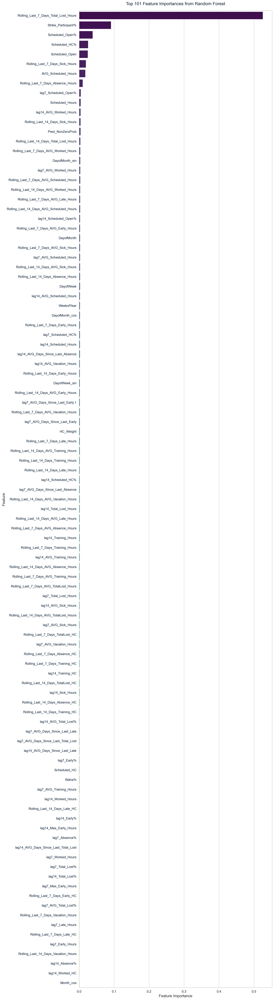

In [24]:
# Calculate cumulative sum of importances
feature_importances['Cumulative_Importance'] = np.cumsum(feature_importances['Importance']) * 100

# Determine the number of features required to reach 90% and 95% cumulative importance
cumulative_feature_importances_90 = len(feature_importances[feature_importances.Cumulative_Importance <= 90])
cumulative_feature_importances_95 = len(feature_importances[feature_importances.Cumulative_Importance <= 95])

print(f'{cumulative_feature_importances_90} features required to fulfill approximately 90% of the highest features in the dataset')
print(f'{cumulative_feature_importances_95} features required to fulfill approximately 95% of the highest features in the dataset')

# Select the top N features covering 95% importance
N = cumulative_feature_importances_95
top_features = feature_importances.head(N)['Feature'].tolist()

# Filter the original dataset to only include the selected features

selected_features =  top_features
selected_features_rf = selected_features
X_train_selected = X_train[selected_features]
X_valid_selected = X_valid[selected_features]
X_test_selected = X_test[selected_features]

# Re-train the pipeline with the selected features
# Rebuild the preprocessing pipeline with selected features
selected_numeric_cols = [col for col in selected_features if col in numeric_cols]
selected_passthrough_cols = [col for col in selected_features if col in updated_passthrough_cols]
# Updated ColumnTransformer to match the selected features
preprocessor = ColumnTransformer(
    transformers=[
        ('numeric_cols', StandardScaler(), selected_numeric_cols),  
        ('passthrough', 'passthrough', selected_passthrough_cols)
    ]
)

# Rebuild the pipeline
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', rf)
])



pipeline.fit(X_train_selected, y_train)



# Evaluate on Validation Set
y_valid_pred = pipeline.predict(X_valid_selected)
mse_valid = mean_squared_error(y_valid, y_valid_pred)
r2_valid = r2_score(y_valid, y_valid_pred)
mae_valid = mean_absolute_error(y_valid, y_valid_pred)
rmse_valid = np.sqrt(mse_valid)

print('Validation Performance of Base Random Forest Model with Selected Features')
print(f'R-squared (R2): {r2_valid:.4f}')
print(f'MSE: {mse_valid:.4f}')
print(f'MAE: {mae_valid:.4f}')
print(f'RMSE: {rmse_valid:.4f}')


# Final evaluation on Test Set
y_test_pred = pipeline.predict(X_test_selected)
mse_test = mean_squared_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)
mae_test = mean_absolute_error(y_test, y_test_pred)
rmse_test = np.sqrt(mse_test)

# Print evaluation metrics
print('Test Performance of Base Random Forest Model with Selected Features')
print('Random Forest R-squared (R2) score: {:.4f}'.format(r2_test))
print('Random Forest Mean Squared Error (MSE): {:.4f}'.format(mse_test))
print('Random Forest Mean Absolute Error (MAE): {:.4f}'.format(mae_test))
print('Random Forest Root Mean Squared Error (RMSE): {:.4f}'.format(rmse_test))


# Display top 10 feature importances
print("\nTop 10 Feature Importances:")
print(feature_importances.head(10))

# Adjusted plot for top feature importances
plt.figure(figsize=(14, max(8, len(feature_importances.head(N)) * 0.5)))  # Dynamic height based on the number of features
sns.barplot(
    x=feature_importances.head(N)['Importance'], 
    y=feature_importances.head(N)['Feature'], 
    palette='viridis'
)

# Customize plot aesthetics
plt.xlabel('Feature Importance', fontsize=14)
plt.ylabel('Feature', fontsize=14)
plt.title(f'Top {N} Feature Importances from Random Forest', fontsize=16, pad=20)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# Adjust layout for better spacing
plt.tight_layout()
plt.show()


# 📊 **Model Performance Comparison**

---

## 1️⃣ **Base Random Forest Model (Without Classification)**

### ✅ **Validation Performance:**
- **R-squared (R²):** 0.7632
- **MSE:** 21.0019
- **MAE:** 2.0516
- **RMSE:** 4.5828

### 🧪 **Test Performance:**
- **R-squared (R²):** 0.6671
- **MSE:** 13.1088
- **MAE:** 1.6658
- **RMSE:** 3.6206

---

## 2️⃣ **With Classification Step (Before Feature Selection)**

### ✅ **Validation Performance:**
- **R-squared (R²):** 0.7639 **(↑ Slight Improvement)**  
- **MSE:** 20.9425 **(↓ Slight Decrease)**  
- **MAE:** 2.0543 **(≈ Similar to Base Model)**  
- **RMSE:** 4.5763 **(↓ Slight Decrease)**  

### 🧪 **Test Performance:**
- **R-squared (R²):** 0.6507 **(↓ Decreased)**  
- **MSE:** 13.7585 **(↑ Increased)**  
- **MAE:** 1.6768 **(↑ Increased)**  
- **RMSE:** 3.7093 **(↑ Increased)**  

---

## 3️⃣ **With Classification + Selected Features (After RFECV)**

### ✅ **Validation Performance:**
- **R-squared (R²):** 0.7618 **(↓ Decreased)**  
- **MSE:** 21.1268 **(↑ Increased)**  
- **MAE:** 2.0621 **(↑ Increased)**  
- **RMSE:** 4.5964 **(↑ Increased)**  

### 🧪 **Test Performance:**
- **R-squared (R²):** 0.6625 **(↓ Decreased)**  
- **MSE:** 13.2920 **(↑ Increased)**  
- **MAE:** 1.6760 **(↑ Increased)**  
- **RMSE:** 3.6458 **(↑ Increased)**  

---

# 🚨 **Key Observations**

### ❌ **1. The Classification Step Does NOT Improve Performance**
- Although there's a **slight validation improvement** (**R²: 0.7632 → 0.7639**), the **test R² dropped** from **0.6671 → 0.6507**, indicating **reduced generalization**.
- **MSE & RMSE increased** on the test set, meaning the model’s predictions became **less accurate** after adding the classification step.
- **Conclusion:**  
  The classification step **fails to improve real-world performance** and may even introduce **unnecessary complexity** without added benefit.

---

### 🚫 **2. RFECV Feature Selection Further Reduces Performance**
- **R² dropped** further on both validation (**0.7639 → 0.7618**) and test sets (**0.6507 → 0.6625**), reflecting **loss of predictive power**.
- **Error metrics (MSE, MAE, RMSE)** **worsened**, suggesting that RFECV **removed critical features**, leading to **underfitting**.
- **Conclusion:**  
  RFECV seems to have **negatively impacted** the model by over-selecting features, reducing the model’s ability to capture complex patterns.

---

# 🚀 **Final Conclusion**

- **The Classification Step Adds No Value:**  
  It **reduces model performance** on the test set, indicating it’s **ineffective** for this specific dataset.  
- **Feature Selection (RFECV) Worsens the Issue:**  
  Removing features leads to **poorer performance** due to the loss of important predictive signals.

### ⚡ **Recommendation:**  
- **Remove the classification step** and focus on optimizing the base model.  
- **Re-evaluate feature selection strategies**—consider using **model-based feature importance** instead of RFECV.  
- **Focus on regularization** or **advanced ensemble techniques** to handle class imbalance more effectively.

> **Bottom Line:**  
> The classification step, instead of enhancing performance, **introduces complexity** and **degrades results**. The base model remains the **most reliable approach** for this problem. 📉


In [ ]:
#######################
X_train = train[feature_cols]
y_train = train[target_col].values.ravel()



X_valid = valid[feature_cols]
y_valid = valid[target_col].values.ravel()



X_test = test[feature_cols]
y_test = test[target_col].values.ravel()

####
print(f'Number of Pass through Columns {len(passthrough_cols)}')
print(f'Number of numerical {len(numeric_cols)}')
print(f'Number of target_col {len(target_col)}')
print(f'Number of feature_cols_all {len(feature_cols_all)}')

# **Before Standar Scaler**

In [15]:
X_train[numeric_cols].describe()

,AVG_Scheduled_Hours,DayofMonth_cos,DayofMonth_sin,DayofWeek_cos,DayofWeek_sin,HC,HC_Weight,Month_cos,Month_sin,Rolling_Last_14_Days_AVG_Absence_Hours,Rolling_Last_14_Days_AVG_Early_Hours,Rolling_Last_14_Days_AVG_Late_Hours,Rolling_Last_14_Days_AVG_Scheduled_Hours,Rolling_Last_14_Days_AVG_Sick_Hours,Rolling_Last_14_Days_AVG_TotalLost_Hours,Rolling_Last_14_Days_AVG_Training_Hours,Rolling_Last_14_Days_AVG_Vacation_Hours,Rolling_Last_14_Days_AVG_Worked_Hours,Rolling_Last_14_Days_Absence_HC,Rolling_Last_14_Days_Absence_Hours,Rolling_Last_14_Days_Early_HC,Rolling_Last_14_Days_Early_Hours,Rolling_Last_14_Days_Late_HC,Rolling_Last_14_Days_Late_Hours,Rolling_Last_14_Days_Scheduled_HC,Rolling_Last_14_Days_Scheduled_Hours,Rolling_Last_14_Days_Sick_Hours,Rolling_Last_14_Days_TotalLost_HC,Rolling_Last_14_Days_Total_Lost_Hours,Rolling_Last_14_Days_Training_HC,Rolling_Last_14_Days_Training_Hours,Rolling_Last_14_Days_Vacation_HC,Rolling_Last_14_Days_Vacation_Hours,Rolling_Last_14_Days_Worked_HC,Rolling_Last_14_Days_Worked_Hours,Rolling_Last_7_Days_AVG_Absence_Hours,Rolling_Last_7_Days_AVG_Early_Hours,Rolling_Last_7_Days_AVG_Late_Hours,Rolling_Last_7_Days_AVG_Scheduled_Hours,Rolling_Last_7_Days_AVG_Sick_Hours,...,lag7_AVG_Late%,lag7_AVG_Late_Hours,lag7_AVG_Scheduled_Hours,lag7_AVG_Sick_Hours,lag7_AVG_TotalLost_Hours,lag7_AVG_Total_Lost%,lag7_AVG_Training_Hours,lag7_AVG_Vacation_Hours,lag7_AVG_Worked_Hours,lag7_Absence%,lag7_Absence_HC,lag7_Absence_Hours,lag7_Early%,lag7_Early_HC,lag7_Early_Hours,lag7_HC,lag7_Late%,lag7_Late_HC,lag7_Late_Hours,lag7_Max_Absence_Hours,lag7_Max_Early_Hours,lag7_Max_Late_Hours,lag7_Max_Total_Lost_Hours,lag7_Scheduled_HC,lag7_Scheduled_HC%,lag7_Scheduled_Hours,lag7_Scheduled_Open,lag7_Scheduled_Open%,lag7_Sick_HC,lag7_Sick_Hours,lag7_TotalLost_HC,lag7_Total_Lost%,lag7_Total_Lost_Hours,lag7_Training_HC,lag7_Training_Hours,lag7_Vacation_HC,lag7_Vacation_Hours,lag7_Waha%,lag7_Worked_HC,lag7_Worked_Hours
count,19300.000000,19300.000000,1.930000e+04,19300.000000,19300.000000,19300.000000,19300.000000,1.930000e+04,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,...,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000,19300.000000
mean,5.513408,-0.029537,-1.073611e-02,0.003807,0.000822,2.185627,0.023441,-7.546970e-02,0.170269,0.115684,0.020305,0.011576,1.857990,0.107728,0.142574,0.175968,0.220009,1.799711,0.910295,1.817865,0.534871,0.899894,0.718519,0.687780,4.221960,6.286288,1.704451,1.351579,2.155719,1.336589,1.804990,1.246169,2.419514,4.168458,6.213600,0.111266,0.019792,0.011434,1.853630,0.103208,...,0.001353,0.010043,5.518338,0.086990,0.115739,0.019600,0.138745,0.168000,5.166792,0.020994,0.167627,0.454340,0.003029,0.069286,0.132436,2.177535,0.001758,0.093700,0.085950,0.399486,0.124611,0.079345,0.493082,1.737977,0.669697,3.399406,1.778181,0.510818,0.239772,0.433053,0.278381,0.025658,0.570909,0.278417,0.476157,0.239772,0.641988,0.595207,1.698148,3.330810
std,2.900613,0.698786,7.146765e-01,0.707478,0.706761,0.992390,0.030376,7.042550e-01,0.685119,0.191564,0.038830,0.024707,0.215721,0.186899,0.200026,0.345887,0.284372,0.232478,1.115175,1.979569,0.775362,1.242652,0.830357,0.891139,1.220208,1.301512,1.973576,1.242643,

In [16]:
# Select numerical columns for scaling
X_train_numeric = X_train[numeric_cols]
X_test_numeric = X_test[numeric_cols]
X_valid_numeric = X_valid[numeric_cols]

# Initialize a standard scaler and fit it
scaler = StandardScaler()
scaler.fit(X_train_numeric)

# Scale and center the numerical data
X_train_scaled_numeric = scaler.transform(X_train_numeric)
X_test_scaled_numeric = scaler.transform(X_test_numeric)
X_valid_scaled_numeric = scaler.transform(X_valid_numeric)

# Replace the scaled numerical columns in the original DataFrame
X_train_e_l_n = X_train.copy()
X_test_e_l_n = X_test.copy()
X_valid_e_l_n = X_valid.copy()

X_train_e_l_n[numeric_cols] = X_train_scaled_numeric
X_test_e_l_n[numeric_cols] = X_test_scaled_numeric
X_valid_e_l_n[numeric_cols] = X_valid_scaled_numeric


# **After Standar Scaler**

In [17]:
X_train_e_l_n[numeric_cols].describe()

,AVG_Scheduled_Hours,DayofMonth_cos,DayofMonth_sin,DayofWeek_cos,DayofWeek_sin,HC,HC_Weight,Month_cos,Month_sin,Rolling_Last_14_Days_AVG_Absence_Hours,Rolling_Last_14_Days_AVG_Early_Hours,Rolling_Last_14_Days_AVG_Late_Hours,Rolling_Last_14_Days_AVG_Scheduled_Hours,Rolling_Last_14_Days_AVG_Sick_Hours,Rolling_Last_14_Days_AVG_TotalLost_Hours,Rolling_Last_14_Days_AVG_Training_Hours,Rolling_Last_14_Days_AVG_Vacation_Hours,Rolling_Last_14_Days_AVG_Worked_Hours,Rolling_Last_14_Days_Absence_HC,Rolling_Last_14_Days_Absence_Hours,Rolling_Last_14_Days_Early_HC,Rolling_Last_14_Days_Early_Hours,Rolling_Last_14_Days_Late_HC,Rolling_Last_14_Days_Late_Hours,Rolling_Last_14_Days_Scheduled_HC,Rolling_Last_14_Days_Scheduled_Hours,Rolling_Last_14_Days_Sick_Hours,Rolling_Last_14_Days_TotalLost_HC,Rolling_Last_14_Days_Total_Lost_Hours,Rolling_Last_14_Days_Training_HC,Rolling_Last_14_Days_Training_Hours,Rolling_Last_14_Days_Vacation_HC,Rolling_Last_14_Days_Vacation_Hours,Rolling_Last_14_Days_Worked_HC,Rolling_Last_14_Days_Worked_Hours,Rolling_Last_7_Days_AVG_Absence_Hours,Rolling_Last_7_Days_AVG_Early_Hours,Rolling_Last_7_Days_AVG_Late_Hours,Rolling_Last_7_Days_AVG_Scheduled_Hours,Rolling_Last_7_Days_AVG_Sick_Hours,...,lag7_AVG_Late%,lag7_AVG_Late_Hours,lag7_AVG_Scheduled_Hours,lag7_AVG_Sick_Hours,lag7_AVG_TotalLost_Hours,lag7_AVG_Total_Lost%,lag7_AVG_Training_Hours,lag7_AVG_Vacation_Hours,lag7_AVG_Worked_Hours,lag7_Absence%,lag7_Absence_HC,lag7_Absence_Hours,lag7_Early%,lag7_Early_HC,lag7_Early_Hours,lag7_HC,lag7_Late%,lag7_Late_HC,lag7_Late_Hours,lag7_Max_Absence_Hours,lag7_Max_Early_Hours,lag7_Max_Late_Hours,lag7_Max_Total_Lost_Hours,lag7_Scheduled_HC,lag7_Scheduled_HC%,lag7_Scheduled_Hours,lag7_Scheduled_Open,lag7_Scheduled_Open%,lag7_Sick_HC,lag7_Sick_Hours,lag7_TotalLost_HC,lag7_Total_Lost%,lag7_Total_Lost_Hours,lag7_Training_HC,lag7_Training_Hours,lag7_Vacation_HC,lag7_Vacation_Hours,lag7_Waha%,lag7_Worked_HC,lag7_Worked_Hours
count,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,...,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04,1.930000e+04
mean,3.681569e-17,-2.945255e-17,5.890510e-18,-5.301459e-17,-1.546259e-17,-4.049725e-17,1.767153e-17,-1.884963e-16,7.657663e-17,2.503467e-17,-1.619890e-17,-4.638776e-17,5.544442e-16,-1.472627e-17,2.503467e-17,-3.681569e-17,-5.301459e-17,-9.071385e-16,-6.774086e-17,1.303275e-16,6.332298e-17,3.092518e-17,3.239780e-17,-6.755678e-17,-7.495674e-16,2.812718e-16,3.828831e-17,-2.429835e-16,1.060292e-16,5.890510e-17,6.479561e-17,-1.295912e-16,1.443175e-16,-5.198375e-16,1.870237e-16,5.595984e-17,-4.859671e-17,-6.111404e-17,-9.896056e-16,2.061678e-17,...,3.552714e-17,3.055702e-17,-1.597801e-16,-6.479561e-17,-7.363137e-18,2.429835e-17,-1.583074e-17,1.472627e-17,-2.915802e-16,3.239780e-17,2.061678e-17,1.619890e-17,5.154196e-17,5.890510e-17,-1.803969e-17,-1.472627e-18,-2.208941e-18,-4.344251e-17,7.657663e-17,4.417882e-18,-6.111404e-17,6.810902e-17,-2.945255e-18,1.457901e-16,-7.363137e-17,2.856897e-16,3.534306e-17,2.842171e-16,2.945255e-18,-1.001387e-16,1.104471e-17,1.325365e-17,-4.123357e-17,4.123357e-17

### **Please note that:**

Tree-based models: Algorithms such as Decision Trees, Random Forest, and Gradient Boosting (e.g., XGBoost, LightGBM) do not require scaling because they split on feature values rather than relying on distances or gradients.
### **However:**

Scaling after log transformations: Even for tree-based models, scaling after applying log transformations to skewed columns ensures that the transformed features are properly centered and normalized, which can improve preprocessing consistency and interpretability.
### **Additionally:**

Standard Scaler: Applying the Standard Scaler ensures a smooth testing period by standardizing numerical features, especially when transitioning between training, validation, and testing datasets.

In [18]:
print(range(X_train_e_l_n.shape[1]))

# Set attributes for PCA analysis
n=X_train_e_l_n[feature_cols].shape[1]

columns = ['PCA_' + str(i+1) for i in range(X_train_e_l_n[feature_cols].shape[1])]

# Create the PCA instance and fit and transform the data with pca
pca = PCA(n_components=n)
pc = pca.fit_transform(X_train_e_l_n[feature_cols])
df_pc = pd.DataFrame(pc, columns=columns, index=X_train_e_l_n[feature_cols].index)

df_pc.head()

range(0, 230)


,PCA_1,PCA_2,PCA_3,PCA_4,PCA_5,PCA_6,PCA_7,PCA_8,PCA_9,PCA_10,PCA_11,PCA_12,PCA_13,PCA_14,PCA_15,PCA_16,PCA_17,PCA_18,PCA_19,PCA_20,PCA_21,PCA_22,PCA_23,PCA_24,PCA_25,PCA_26,PCA_27,PCA_28,PCA_29,PCA_30,PCA_31,PCA_32,PCA_33,PCA_34,PCA_35,PCA_36,PCA_37,PCA_38,PCA_39,PCA_40,...,PCA_191,PCA_192,PCA_193,PCA_194,PCA_195,PCA_196,PCA_197,PCA_198,PCA_199,PCA_200,PCA_201,PCA_202,PCA_203,PCA_204,PCA_205,PCA_206,PCA_207,PCA_208,PCA_209,PCA_210,PCA_211,PCA_212,PCA_213,PCA_214,PCA_215,PCA_216,PCA_217,PCA_218,PCA_219,PCA_220,PCA_221,PCA_222,PCA_223,PCA_224,PCA_225,PCA_226,PCA_227,PCA_228,PCA_229,PCA_230
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2023-01-15,10.768087,-29.543717,0.614262,-2.700769,3.394658,-0.828318,-6.194654,1.487680,1.539512,-0.192928,-3.664874,3.498117,-4.739139,-2.107743,-0.157259,0.280700,2.229493,-0.532482,0.670252,2.405691,-0.029367,0.954680,0.472760,2.537342,-0.045962,-1.482575,0.738083,2.076017,1.130033,-0.634781,-0.049654,-0.167235,0.402944,0.442388,1.069205,-0.344097,0.107480,-0.147594,0.278178,1.188927,...,0.027877,0.052271,0.004172,0.020855,0.028410,-0.021558,0.042867,-0.041798,0.020349,-0.018446,0.026080,-0.039074,0.000510,0.007229,0.001936,-0.002921,-0.002469,0.003757,0.008851,-0.004266,-0.003303,-0.004281,-0.017304,0.001182,-0.000921,0.001551,-0.002652,-0.001236,-0.000873,-6.580206e-14,-1.656831e-14,2.491117e-14,2.676337e-15,-1.267175e-14,-4.278475e-15,5.321274e-14,8.477457e-14,-9.641932e-16,-2.604036e-14,2.047272e-14
2023-01-15,9.812127,-29.177137,0.612760,-4.326567,0.674698,0.793772,-7.817323,2.165212,2.005354,-1.573902,-1.710354,3.350822,-3.422338,-0.470666,-0.907645,0.444606,2.368581,0.151707,0.299840,0.395064,0.896892,-0.576851,0.238173,1.341462,-1.768343,-0.477863,0.211237,0.075207,0.985860,-0.552780,0.167865,-0.611367,-0.608764,0.180794,0.612310,-0.502121,-0.220072,0.040632,-0.400451,0.422047,...,0.019350,0.040342,-0.027238,-0.005028,0.015303,0.002420,0.052384,-0.041257,0.028768,0.002589,-0.024575,-0.006947,-0.007772,-0.008550,-0.001087,0.009103,0.003215,-0.001193,-0.002320,-0.013146,-0.002807,-0.005649,-0.011232,0.008724,-0.000171,0.000729,0.000159,-0.000706,0.000112,1.239734e-13,2.035489e-14,-2.539922e-14,-8.274624e-15,1.044302e-14,2.257766e-15,-5.080831e-14,-7.171900e-14,-5.261871e-15,1.230165e-14,1.513772e-14
2023-01-15,8.937601,-28.879599,0.574150,-7.210887,6.635016,-0.764586,-6.989816,2.241034,1.841240,-0.947948,-1.244265,4.061773,-4.501385,-0.626727,-0.997985,0.207497,2.355737,-0.850007,-1.311129,-0.644301,-1.177557,-0.348576,-1.107772,3.766727,-0.239758,-0.322853,0.088000,-0.248349,1.244674,-0.777862,0.168372,-0.211892,0.594052,0.281856,0.693867,-0.095378,0.300151,0.257152,0.727618,0.227977,...,0.021761,0.014280,-0.015865,-0.057745,0.071043,-0.033403,0.070418,0.009039,0.035502,-0.004350,0.006544,0.005629,-0.004703,-0.003539,0.006596,0.003984,-0.000200,-0.002430,-0.005169,-0.000692,0.000749,-0.000102,-0.017490,0.009444,0.000087,0.002208,-0.001726,-0.000451,-0.001612,-6.430586e-15,1.353359e-15,-6.262930e-15,1.140616e-15,2.378642e-15,5.110634e-15,-2.193897e-14,-2.611222e-14,-5.015456e-15,1.515291e-15,-3.296458e-15
2023-01-15,7.985440,-28.328999,0.604984,-4.586133,1.755127,0.000760,-5.195256,2.255828,2.323216,-1.107691,-3.167490,3.340833,-4.873749,-1.713104,-0.226570,0.596584,3.346311,-0.060128,1.066928,0.667252,0.392152,-0.542142,-0.395707,1.813921,-0.608714,-1.865732,0.388612,2.347703,1.091590,-0.502142,0.171237,-0.294583,0.194188,0.381815,0.306256,-0.410063,-0.337416,-0.513154,0.233803,0.256443,...,0.039225,0.024876,-0.046374,0.000050,0.013151,-0.018753,0.049470,-0.003123,0.019387,-0.001829,-0.022906,-0.009911,0.028993,-0.004193,-0.004250,-0.006924,-0.004212,-0.001754,-0.005007,-0.016057,-0.006277,-0.005453,-0.010859,0.015785,0.000192,0.000166,0.002422,0.000036,0.000668,2.306314e-14,2.069112e-15,-1.059235e-15,1.436531e-15,6.196439e-16,-3.726131e-15,3.917278e-15,4.198321e-15,1.469608e-15,1.735589e-15,-1.487274e-16
2023-01-15,7.147088,-27.777895,0.600711,-0

In [19]:
X_train_e_l_n.shape

(19300, 230)

In [20]:
cumulative_var_explained = np.cumsum(pca.explained_variance_ratio_)*100
cumulative_var_explained_high = len(cumulative_var_explained[cumulative_var_explained<=95])
cumulative_var_explained = len(cumulative_var_explained[cumulative_var_explained<=90])
print((f'{cumulative_var_explained} feautres required to explain  approximately 90% of the variance in the dataset'))
print((f'{cumulative_var_explained_high} feautres required to explain  approximately 95% of the variance in the dataset'))

10 feautres required to explain  approximately 90% of the variance in the dataset
19 feautres required to explain  approximately 95% of the variance in the dataset


In [21]:
#Convert y_train to a Pandas Series
y_train_series = pd.Series(y_train, index=X_train_e_l_n[feature_cols].index, name='Target')

# Concatenate PCA components with target variable
df_PCA = pd.concat([df_pc, y_train_series], axis=1)

# Display the first few rows
df_PCA.head()

,PCA_1,PCA_2,PCA_3,PCA_4,PCA_5,PCA_6,PCA_7,PCA_8,PCA_9,PCA_10,PCA_11,PCA_12,PCA_13,PCA_14,PCA_15,PCA_16,PCA_17,PCA_18,PCA_19,PCA_20,PCA_21,PCA_22,PCA_23,PCA_24,PCA_25,PCA_26,PCA_27,PCA_28,PCA_29,PCA_30,PCA_31,PCA_32,PCA_33,PCA_34,PCA_35,PCA_36,PCA_37,PCA_38,PCA_39,PCA_40,...,PCA_192,PCA_193,PCA_194,PCA_195,PCA_196,PCA_197,PCA_198,PCA_199,PCA_200,PCA_201,PCA_202,PCA_203,PCA_204,PCA_205,PCA_206,PCA_207,PCA_208,PCA_209,PCA_210,PCA_211,PCA_212,PCA_213,PCA_214,PCA_215,PCA_216,PCA_217,PCA_218,PCA_219,PCA_220,PCA_221,PCA_222,PCA_223,PCA_224,PCA_225,PCA_226,PCA_227,PCA_228,PCA_229,PCA_230,Target
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2023-01-15,10.768087,-29.543717,0.614262,-2.700769,3.394658,-0.828318,-6.194654,1.487680,1.539512,-0.192928,-3.664874,3.498117,-4.739139,-2.107743,-0.157259,0.280700,2.229493,-0.532482,0.670252,2.405691,-0.029367,0.954680,0.472760,2.537342,-0.045962,-1.482575,0.738083,2.076017,1.130033,-0.634781,-0.049654,-0.167235,0.402944,0.442388,1.069205,-0.344097,0.107480,-0.147594,0.278178,1.188927,...,0.052271,0.004172,0.020855,0.028410,-0.021558,0.042867,-0.041798,0.020349,-0.018446,0.026080,-0.039074,0.000510,0.007229,0.001936,-0.002921,-0.002469,0.003757,0.008851,-0.004266,-0.003303,-0.004281,-0.017304,0.001182,-0.000921,0.001551,-0.002652,-0.001236,-0.000873,-6.580206e-14,-1.656831e-14,2.491117e-14,2.676337e-15,-1.267175e-14,-4.278475e-15,5.321274e-14,8.477457e-14,-9.641932e-16,-2.604036e-14,2.047272e-14,0.0
2023-01-15,9.812127,-29.177137,0.612760,-4.326567,0.674698,0.793772,-7.817323,2.165212,2.005354,-1.573902,-1.710354,3.350822,-3.422338,-0.470666,-0.907645,0.444606,2.368581,0.151707,0.299840,0.395064,0.896892,-0.576851,0.238173,1.341462,-1.768343,-0.477863,0.211237,0.075207,0.985860,-0.552780,0.167865,-0.611367,-0.608764,0.180794,0.612310,-0.502121,-0.220072,0.040632,-0.400451,0.422047,...,0.040342,-0.027238,-0.005028,0.015303,0.002420,0.052384,-0.041257,0.028768,0.002589,-0.024575,-0.006947,-0.007772,-0.008550,-0.001087,0.009103,0.003215,-0.001193,-0.002320,-0.013146,-0.002807,-0.005649,-0.011232,0.008724,-0.000171,0.000729,0.000159,-0.000706,0.000112,1.239734e-13,2.035489e-14,-2.539922e-14,-8.274624e-15,1.044302e-14,2.257766e-15,-5.080831e-14,-7.171900e-14,-5.261871e-15,1.230165e-14,1.513772e-14,0.0
2023-01-15,8.937601,-28.879599,0.574150,-7.210887,6.635016,-0.764586,-6.989816,2.241034,1.841240,-0.947948,-1.244265,4.061773,-4.501385,-0.626727,-0.997985,0.207497,2.355737,-0.850007,-1.311129,-0.644301,-1.177557,-0.348576,-1.107772,3.766727,-0.239758,-0.322853,0.088000,-0.248349,1.244674,-0.777862,0.168372,-0.211892,0.594052,0.281856,0.693867,-0.095378,0.300151,0.257152,0.727618,0.227977,...,0.014280,-0.015865,-0.057745,0.071043,-0.033403,0.070418,0.009039,0.035502,-0.004350,0.006544,0.005629,-0.004703,-0.003539,0.006596,0.003984,-0.000200,-0.002430,-0.005169,-0.000692,0.000749,-0.000102,-0.017490,0.009444,0.000087,0.002208,-0.001726,-0.000451,-0.001612,-6.430586e-15,1.353359e-15,-6.262930e-15,1.140616e-15,2.378642e-15,5.110634e-15,-2.193897e-14,-2.611222e-14,-5.015456e-15,1.515291e-15,-3.296458e-15,0.0
2023-01-15,7.985440,-28.328999,0.604984,-4.586133,1.755127,0.000760,-5.195256,2.255828,2.323216,-1.107691,-3.167490,3.340833,-4.873749,-1.713104,-0.226570,0.596584,3.346311,-0.060128,1.066928,0.667252,0.392152,-0.542142,-0.395707,1.813921,-0.608714,-1.865732,0.388612,2.347703,1.091590,-0.502142,0.171237,-0.294583,0.194188,0.381815,0.306256,-0.410063,-0.337416,-0.513154,0.233803,0.256443,...,0.024876,-0.046374,0.000050,0.013151,-0.018753,0.049470,-0.003123,0.019387,-0.001829,-0.022906,-0.009911,0.028993,-0.004193,-0.004250,-0.006924,-0.004212,-0.001754,-0.005007,-0.016057,-0.006277,-0.005453,-0.010859,0.015785,0.000192,0.000166,0.002422,0.000036,0.000668,2.306314e-14,2.069112e-15,-1.059235e-15,1.436531e-15,6.196439e-16,-3.726131e-15,3.917278e-15,4.198321e-15,1.469608e-15,1.735589e-15,-1.487274e-16,0.0
2023-01-15,7.147088,-27.777895,0.600711,-0.005163,3.840297,-2.0

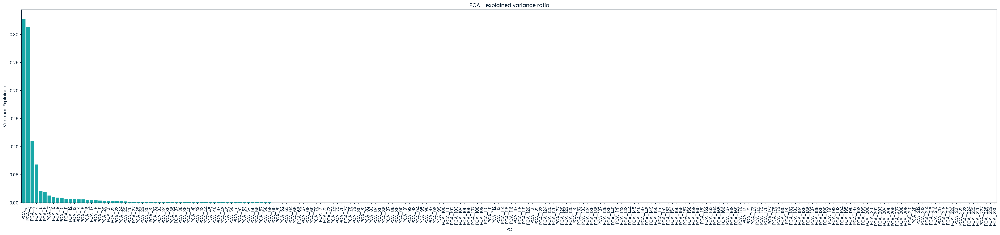

In [22]:
# Instantiate
pca = PCA(n_components=n)

# Fit and transform
principalComponents = pca.fit_transform(X_train_e_l_n[feature_cols])

# List principal components names
principal_components =columns

# Create a DataFrame
pca_df = pd.DataFrame({'Variance Explained': pca.explained_variance_ratio_,
             'PC':principal_components})

plt.figure(figsize=(40, 8))
plt.title('PCA - explained variance ratio')
# Plot DataFrame
sns.barplot(x='PC',y='Variance Explained', 
           data=pca_df, color="c")
plt.xticks(rotation=90)
plt.show()

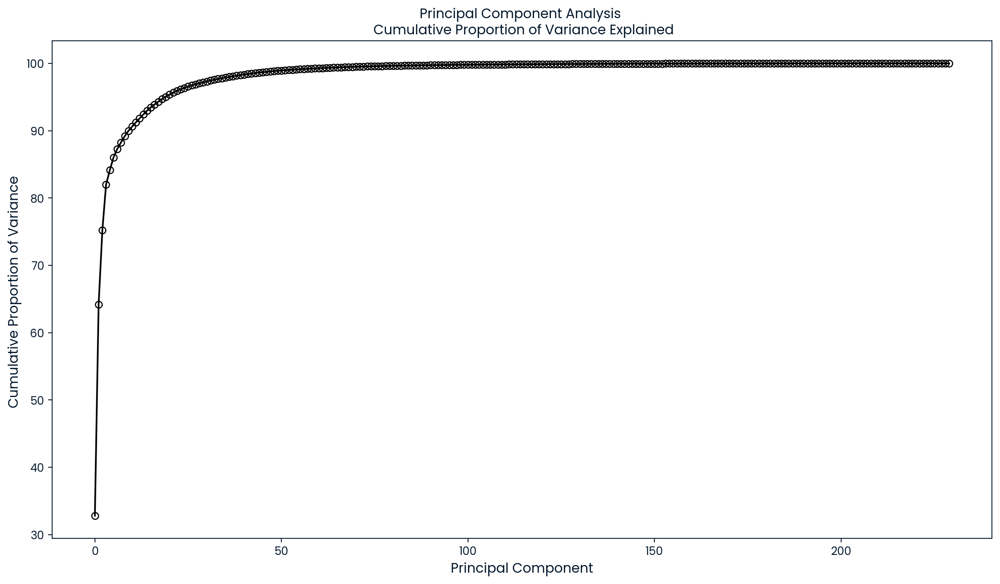

In [23]:
plt.figure(figsize=(15, 8))
# Instantiate, fit and transform


# Assign variance explained
var = pca.explained_variance_ratio_

# Plot cumulative variance
cumulative_var = np.cumsum(var)*100
plt.plot(cumulative_var,'k-o',markerfacecolor='None',markeredgecolor='k')
plt.title('Principal Component Analysis \n Cumulative Proportion of Variance Explained',fontsize=12)
plt.xlabel("Principal Component",fontsize=12)
plt.ylabel("Cumulative Proportion of Variance ",fontsize=12)
plt.show()


From the plots above, we see that  10 features are needed to explain approximately 90% of the variance in the dataset.
From the plots above, we see that  19 features are needed to explain approximately 95% of the variance in the dataset.
This gives us a good intuition of the number of features required in our model.

Next, We will next use RFE to which are the important features for modelling.

Validation Performance of Base Random Forest Model After Log transformation/Standart Scaling and cumulative_var_explained_high
R-squared (R2): 0.7648
MSE: 20.8614
MAE: 2.0232
RMSE: 4.5674
Test Performance of Base Random Forest Model After Log transformation/Standart Scaling and cumulative_var_explained_high
Random Forest R-squared (R2) score: 0.6786
Random Forest Mean Squared Error (MSE): 12.6577
Random Forest Mean Absolute Error (MAE): 1.5890
Random Forest Root Mean Squared Error (RMSE): 3.5578


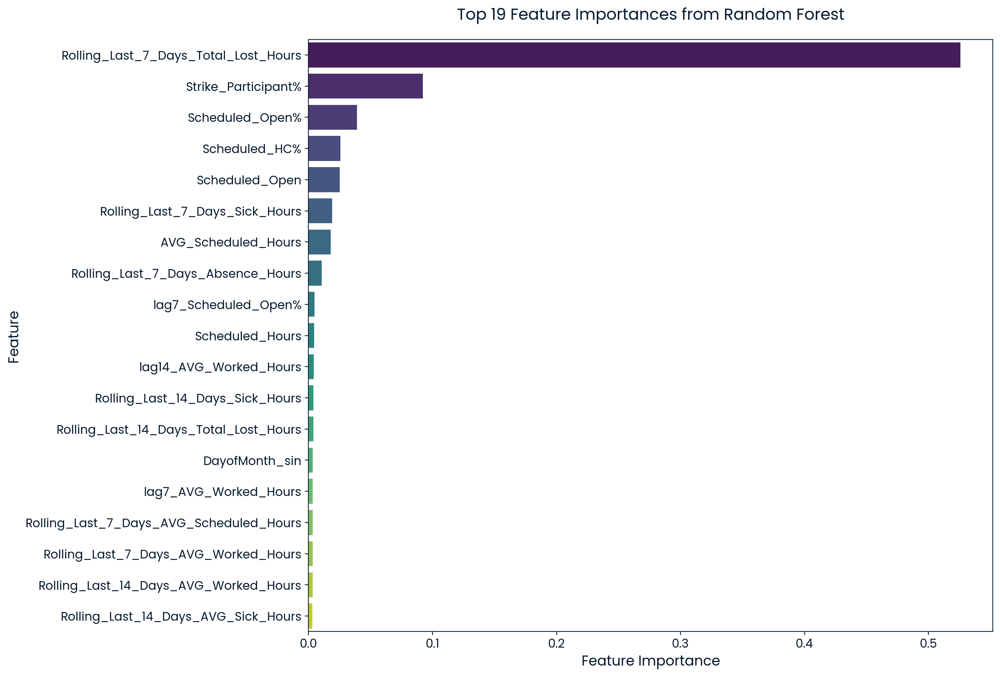

In [24]:
# Define the model
rf = RandomForestRegressor(n_estimators=200, max_depth=20, min_samples_split=2, min_samples_leaf=1, random_state=42)


# Preprocessing pipeline
preprocessor = ColumnTransformer(
    transformers=[
        ('passthrough', 'passthrough', feature_cols)  # Pass through the  columns without transformation
    ]
)

# Create a pipeline
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', rf)
])

# Train the model
pipeline.fit(X_train_e_l_n, y_train)

# Extract feature importances
importances = pipeline.named_steps['model'].feature_importances_

feature_names = feature_cols

# Create a DataFrame for feature importances
feature_importances = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
feature_importances = feature_importances.sort_values(by='Importance', ascending=False)

# Calculate cumulative sum of importances
feature_importances['Cumulative Importance'] = feature_importances['Importance'].cumsum()

# Select the top cumulative_var_explained_high features

N = cumulative_var_explained_high  # Number of top feature required from PCA analysis
top_features = feature_importances.head(N)['Feature'].tolist()
top_features_rf = feature_importances.head(N)['Feature'].tolist()

# Re-train the model with the selected top N features

# Filter the original dataset to only include the selected features

selected_features =  top_features
selected_features_rf = selected_features
X_train_selected = X_train_e_l_n[selected_features]
X_valid_selected = X_valid_e_l_n[selected_features]
X_test_selected = X_test_e_l_n[selected_features]

# Re-train the pipeline with the selected features
# Rebuild the preprocessing pipeline with selected features
selected_numeric_cols = [col for col in selected_features if col in numeric_cols]
selected_passthrough_cols = [col for col in selected_features if col in passthrough_cols]
# Updated ColumnTransformer to match the selected features
preprocessor = ColumnTransformer(
    transformers=[ 
        ('passthrough', 'passthrough', selected_features)
    ]
)

# Rebuild the pipeline
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', rf)
])


pipeline.fit(X_train_selected, y_train)

# Evaluate the model



# Evaluate on Validation Set
y_valid_pred = pipeline.predict(X_valid_selected)
mse_valid = mean_squared_error(y_valid, y_valid_pred)
r2_valid = r2_score(y_valid, y_valid_pred)
mae_valid = mean_absolute_error(y_valid, y_valid_pred)
rmse_valid = np.sqrt(mse_valid)

print('Validation Performance of Base Random Forest Model After Log transformation/Standart Scaling and cumulative_var_explained_high')
print(f'R-squared (R2): {r2_valid:.4f}')
print(f'MSE: {mse_valid:.4f}')
print(f'MAE: {mae_valid:.4f}')
print(f'RMSE: {rmse_valid:.4f}')


# Final evaluation on Test Set
y_test_pred = pipeline.predict(X_test_selected)
mse_test = mean_squared_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)
mae_test = mean_absolute_error(y_test, y_test_pred)
rmse_test = np.sqrt(mse_test)

# Print evaluation metrics
print('Test Performance of Base Random Forest Model After Log transformation/Standart Scaling and cumulative_var_explained_high')
print('Random Forest R-squared (R2) score: {:.4f}'.format(r2_test))
print('Random Forest Mean Squared Error (MSE): {:.4f}'.format(mse_test))
print('Random Forest Mean Absolute Error (MAE): {:.4f}'.format(mae_test))
print('Random Forest Root Mean Squared Error (RMSE): {:.4f}'.format(rmse_test))




# Adjusted plot for top feature importances
plt.figure(figsize=(14, max(8, len(feature_importances.head(N)) * 0.5)))  # Dynamic height based on the number of features
sns.barplot(
    x=feature_importances.head(N)['Importance'], 
    y=feature_importances.head(N)['Feature'], 
    palette='viridis'
)

# Customize plot aesthetics
plt.xlabel('Feature Importance', fontsize=14)
plt.ylabel('Feature', fontsize=14)
plt.title(f'Top {N} Feature Importances from Random Forest', fontsize=16, pad=20)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# Adjust layout for better spacing
plt.tight_layout()
plt.show()


# 📊 **Model Performance After Log Transformation, Standard Scaling, and PCA**

---

## ✅ **Validation Performance:**
- **R-squared (R²):** 0.7648  
- **MSE:** 20.8614  
- **MAE:** 2.0232  
- **RMSE:** 4.5674  

## 🧪 **Test Performance:**
- **R-squared (R²):** 0.6786  
- **MSE:** 12.6577  
- **MAE:** 1.5890  
- **RMSE:** 3.5578  

---

# 📈 **Observations & Key Insights**

1️⃣ **Performance Improvement:**
- **R² improved** on both validation (**0.7632 → 0.7648**) and test sets (**0.6671 → 0.6786**), indicating a **better ability to explain variance** after applying transformations.
- **MSE, MAE, and RMSE decreased**, suggesting **higher prediction accuracy**:
  - **RMSE** dropped from **3.6206 (Base Model)** to **3.5578 (After Transformation)**, reflecting **improved stability**.

2️⃣ **Impact of Preprocessing:**
- Unlike typical Random Forest behavior, **Log Transformation** and **Standard Scaling** slightly **enhanced performance**. This suggests that the data may have had **skewness** or **variance issues** that benefited from these transformations.
- **Dimensionality reduction** via **PCA** helped retain the most critical features without losing predictive power, possibly reducing **noise** in the data.

3️⃣ **Tree-Based Model Flexibility:**
- Although **Random Forests** are generally **robust to unscaled data**, this case demonstrates that **targeted preprocessing** (like log transformation for skewed features) can still **enhance model performance** when carefully applied.

---

# 🚀 **Conclusion**

- **Log Transformation, Standard Scaling, and PCA** provided **performance gains**, with:
  - **Higher R² scores** on both validation and test sets
  - **Lower error metrics** (MSE, MAE, RMSE), indicating **more accurate predictions**
  
- This suggests that while tree-based models don’t require scaling, **selective preprocessing** can still be beneficial depending on the data distribution.

### 🔍 **Next Steps:**
1. **Analyze Feature Contributions Post-PCA:**  
   Ensure that the retained components still align with **business-relevant features**.
2. **Explore Hybrid Approaches:**  
   Combine **PCA-selected features** with **original key features** to see if performance improves further.
3. **Fine-Tune Model Parameters:**  
   Adjust hyperparameters to **fully leverage** the transformed dataset.

> 🚀 **Final Thought:**  
> In this case, thoughtful preprocessing steps like **log transformation** and **PCA** proved beneficial for Random Forests, showing that even robust models can benefit from **strategic data transformations**. 📈


In [46]:
X_train_e_l_n_m = X_train[feature_cols].copy()
X_valid_e_l_n_m = X_valid[feature_cols].copy()
X_test_e_l_n_m = X_test[feature_cols].copy()

Validation Performance of LinearRegression:
R-squared (R2): 0.6979
MSE: 26.7876
MAE: 2.6350
RMSE: 5.1757

Validation Performance of Ridge:
R-squared (R2): 0.6987
MSE: 26.7218
MAE: 2.6215
RMSE: 5.1693

Validation Performance of RandomForestRegressor:
R-squared (R2): 0.7628
MSE: 21.0332
MAE: 2.0671
RMSE: 4.5862

Validation Performance of XGBRegressor:
R-squared (R2): 0.7824
MSE: 19.2998
MAE: 1.9763
RMSE: 4.3932

Validation Performance of LGBMRegressor:
R-squared (R2): 0.7482
MSE: 22.3274
MAE: 2.0276
RMSE: 4.7252

Test Performance of Linear Regression:
R-squared (R2): 0.5005
MSE: 19.6707
MAE: 2.4232
RMSE: 4.4352

SHAP Analysis for Linear Regression:


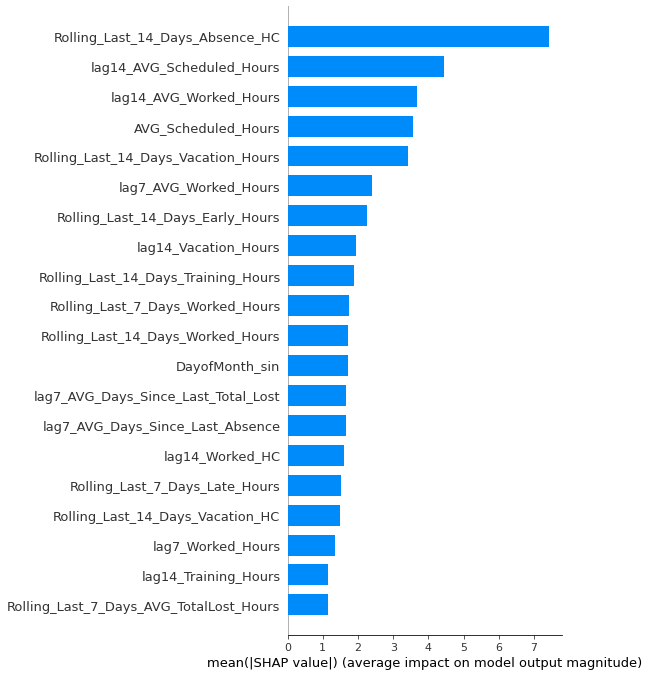

Test Performance of Ridge Regression:
R-squared (R2): 0.5403
MSE: 18.1054
MAE: 2.3421
RMSE: 4.2550

SHAP Analysis for Ridge Regression:


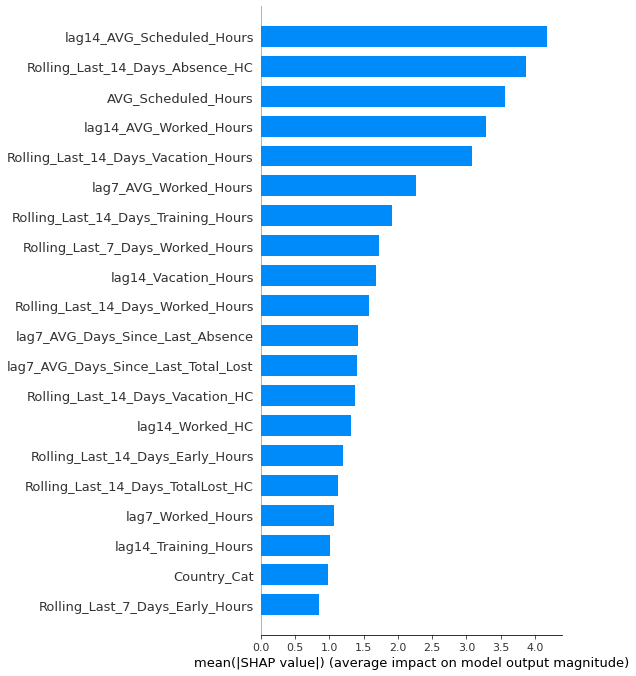

Test Performance of Random Forest:
R-squared (R2): 0.6642
MSE: 13.2244
MAE: 1.6859
RMSE: 3.6365

SHAP Analysis for Random Forest:


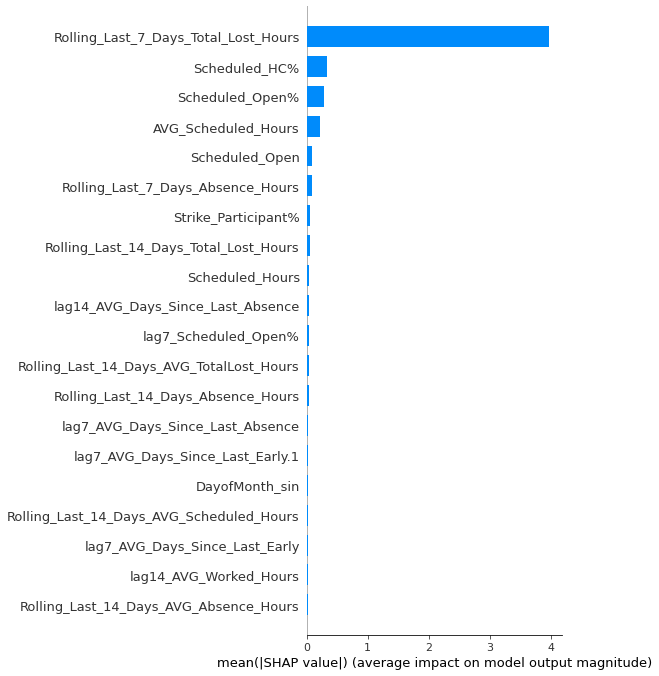

Test Performance of XGBoost:
R-squared (R2): 0.6979
MSE: 11.8968
MAE: 1.5667
RMSE: 3.4492

SHAP Analysis for XGBoost:


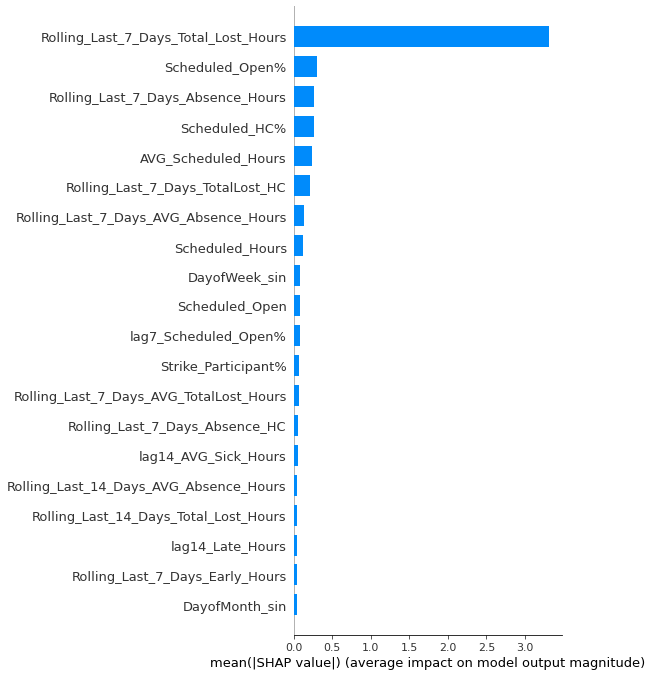

Test Performance of LightGBM:
R-squared (R2): 0.6940
MSE: 12.0503
MAE: 1.5586
RMSE: 3.4714

SHAP Analysis for LightGBM:


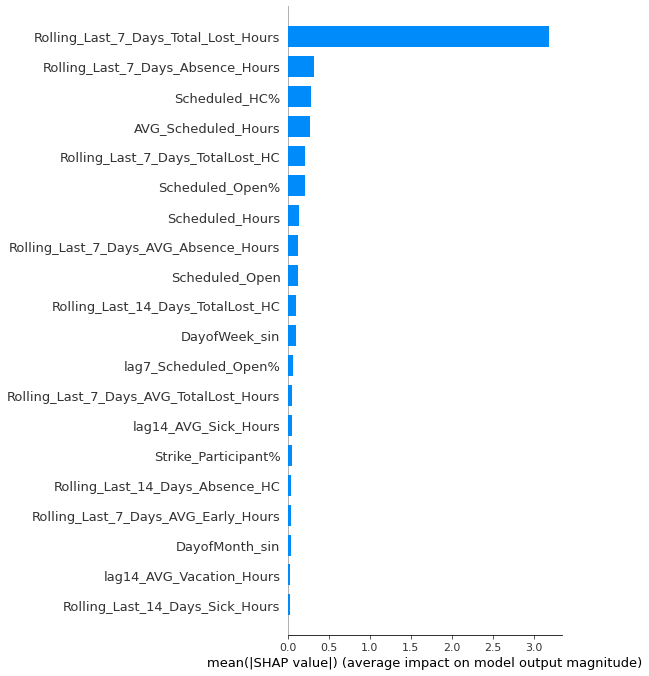

In [23]:
# List of models with basic parameters
models = {
    "Linear Regression": LinearRegression(),
    "Ridge Regression": Ridge(alpha=1.0),
    "Random Forest": RandomForestRegressor(n_estimators=100, random_state=42),
    "XGBoost": XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42, verbosity=0),
    "LightGBM": LGBMRegressor(n_estimators=100, learning_rate=0.1, random_state=42, verbosity=-1)
}

# Function to evaluate models
def evaluate_model(model, X_train, X_valid, y_train, y_valid, scale=False):
    if scale:
        preprocessor = ColumnTransformer(
            transformers=[
                ('numeric_cols', StandardScaler(), numeric_cols),
                ('passthrough', 'passthrough', passthrough_cols)
            ]
        )
        pipeline = Pipeline(steps=[
            ('preprocessor', preprocessor),
            ('model', model)
        ])
    else:
        pipeline = Pipeline(steps=[
            ('model', model)
        ])

    pipeline.fit(X_train, y_train)
    y_valid_pred = pipeline.predict(X_valid)
    mse_valid = mean_squared_error(y_valid, y_valid_pred)
    r2_valid = r2_score(y_valid, y_valid_pred)
    mae_valid = mean_absolute_error(y_valid, y_valid_pred)
    rmse_valid = np.sqrt(mse_valid)

    print(f'Validation Performance of {model.__class__.__name__}:')
    print(f'R-squared (R2): {r2_valid:.4f}')
    print(f'MSE: {mse_valid:.4f}')
    print(f'MAE: {mae_valid:.4f}')
    print(f'RMSE: {rmse_valid:.4f}\n')

    return pipeline

# Iterate through models and evaluate
pipelines = {}
for name, model in models.items():
    scale = True if name in ["Linear Regression", "Ridge Regression"] else False
    pipeline = evaluate_model(model, X_train_e_l_n_m, X_valid_e_l_n_m, y_train, y_valid, scale)
    pipelines[name] = pipeline

# Final evaluation on Test Set
for name, pipeline in pipelines.items():
    y_test_pred = pipeline.predict(X_test)
    mse_test = mean_squared_error(y_test, y_test_pred)
    r2_test = r2_score(y_test, y_test_pred)
    mae_test = mean_absolute_error(y_test, y_test_pred)
    rmse_test = np.sqrt(mse_test)

    print(f'Test Performance of {name}:')
    print(f'R-squared (R2): {r2_test:.4f}')
    print(f'MSE: {mse_test:.4f}')
    print(f'MAE: {mae_test:.4f}')
    print(f'RMSE: {rmse_test:.4f}\n')

    # SHAP Analysis
    print(f'SHAP Analysis for {name}:')
    if name in ["Random Forest", "XGBoost", "LightGBM"]:
        explainer = shap.TreeExplainer(pipeline.named_steps['model'])
    elif name in ["Linear Regression", "Ridge Regression"]:
        explainer = shap.LinearExplainer(pipeline.named_steps['model'], X_valid_e_l_n_m)
    else:
        explainer = shap.Explainer(pipeline.named_steps['model'])

    shap_values = explainer.shap_values(X_valid_e_l_n_m)

    # SHAP Summary Plot
    shap.summary_plot(shap_values, X_valid_e_l_n_m, plot_type="bar")


In [26]:
# ---------------------
# Function for Ridge and Linear Regression
# ---------------------
tscv = TimeSeriesSplit(n_splits=3)

def train_linear_models(X_train, y_train, X_test, y_test, numerical_cols, passthrough_cols):
    param_dist_ridge = {
        'preprocessor__num__poly__degree': randint(1, 2),  # Correct path
        'ridge__alpha': uniform(1e-3, 1e3),
        'ridge__fit_intercept': [True, False],
        'ridge__solver': ['auto', 'svd'],
        'ridge__tol': uniform(1e-3, 1e-2)
    }

    param_dist_linear = {
        'preprocessor__num__poly__degree': randint(1, 2),  # Correct path
        'Linear__fit_intercept': [True, False],
        'Linear__copy_X': [True, False],
        'Linear__positive': [True, False]
    }

    best_params = {}
    best_features = {}

    # Preprocessing pipeline for numerical and passthrough columns
    preprocessor = ColumnTransformer(transformers=[
        ('num', Pipeline([
            ('scaler', StandardScaler()),
            ('poly', PolynomialFeatures(interaction_only=True, include_bias=False))
        ]), numerical_cols),
        ('passthrough', 'passthrough', passthrough_cols)
    ])

    # Ridge Regression Pipeline
    ridge_pipe = Pipeline([
        ('preprocessor', preprocessor),
        ('ridge', Ridge())
    ])
    print("\nTuning Ridge...")
    random_search_ridge = RandomizedSearchCV(
        ridge_pipe,
        param_distributions=param_dist_ridge,
        n_iter=10,
        cv=tscv,
        scoring='neg_mean_squared_error',
        n_jobs=1,
        error_score='raise', 
        random_state=42
    )
    random_search_ridge.fit(X_train, y_train)
    best_params['Ridge'] = random_search_ridge.best_params_

    # Linear Regression Pipeline
    print("\nTuning Linear...")
    linear_pipe = Pipeline([
        ('preprocessor', preprocessor),
        ('Linear', LinearRegression())
    ])
    random_search_linear = RandomizedSearchCV(
        linear_pipe,
        param_distributions=param_dist_linear,
        n_iter=10,
        cv=tscv,
        scoring='neg_mean_squared_error',
        n_jobs=1,
        random_state=42
    )
    random_search_linear.fit(X_train, y_train)
    best_params['Linear'] = random_search_linear.best_params_

    # -------------------------------
    # Feature Selection with RFECV
    # -------------------------------
    models_for_rfecv = {
        'Ridge': Ridge(**{key.split('__')[1]: value for key, value in best_params['Ridge'].items() if key.startswith('ridge__')}),
        'Linear': LinearRegression(**{key.split('__')[1]: value for key, value in best_params['Linear'].items() if key.startswith('Linear__')})
    }

    for name, model in models_for_rfecv.items():
        print(f"\nPerforming RFECV for {name}...")
        rfecv = RFECV(estimator=model, step=1, cv=tscv,
                      scoring='neg_mean_squared_error', n_jobs=1)
        rfecv.fit(X_train, y_train)
        best_features[name] = X_train.columns[rfecv.support_].tolist()
        print(f"Optimal features for {name}: {rfecv.n_features_}")

    # -------------------------------
    # Create Meta Features (Union)
    # -------------------------------
    all_features = set()
    for features in best_features.values():
        all_features.update(features)
    meta_features = list(all_features)

    # -------------------------------
    # Final Model Training and Evaluation
    # -------------------------------
    results_lin = []
    final_models = {
        'Ridge': Ridge(**{key.split('__')[1]: value for key, value in best_params['Ridge'].items() if key.startswith('ridge__')}),
        'Linear': LinearRegression(**{key.split('__')[1]: value for key, value in best_params['Linear'].items() if key.startswith('Linear__')})
    }

    for model_name, model in final_models.items():
        features = best_features[model_name]
        model.fit(X_train[features], y_train)
        preds = model.predict(X_test[features])

        results_lin.append({
            'Model': model_name,
            'R2': r2_score(y_test, preds),
            'MSE': mean_squared_error(y_test, preds),
            'MAE': mean_absolute_error(y_test, preds),
            'RMSE': np.sqrt(mean_squared_error(y_test, preds))
        })

    results_df_lin = pd.DataFrame(results_lin)
    print("\nFinal Evaluation Results:")
    print(results_df_lin)

    # ✅ Matching the return structure with the tree models
    return {
        'best_params': best_params,
        'best_features': best_features,
        'meta_features': meta_features,
        'results': results_df_lin
    }

In [27]:
# Start timer
start_time = time.perf_counter()
print('')
print('Starting time: ', datetime.datetime.now().strftime("%H:%M:%S"))
print('')

# Train the models and get the results
results_lin = train_linear_models(X_train_e_l_n_m, y_train, X_test_e_l_n_m, y_test,numeric_cols,passthrough_cols)

# End timing
end_time = time.perf_counter()
duration = end_time - start_time
print(f"\nTotal execution time: {duration:.2f} seconds")


Starting time:  19:40:51


Tuning Ridge...

Tuning Linear...

Performing RFECV for Ridge...
Optimal features for Ridge: 136

Performing RFECV for Linear...
Optimal features for Linear: 112

Final Evaluation Results:
    Model        R2        MSE       MAE      RMSE
0   Ridge  0.477263  20.587224  2.270166  4.537315
1  Linear  0.580593  16.517708  2.142032  4.064198

Total execution time: 189.50 seconds


In [47]:

# #### Reconstructed results_lin dictionary
results_lin ={'best_params': {'Ridge': {'preprocessor__num__poly__degree': 1,
   'ridge__alpha': 58.084612168199456,
   'ridge__fit_intercept': False,
   'ridge__solver': 'auto',
   'ridge__tol': 0.007011150117432088},
  'Linear': {'Linear__copy_X': True,
   'Linear__fit_intercept': True,
   'Linear__positive': False,
   'preprocessor__num__poly__degree': 1}},
 'best_features': {'Ridge': ['Is_Strike',
   'MU_Name_1',
   'MU_Name_2',
   'MU_Name_4',
   'MU_Name_5',
   'MU_Name_6',
   'MU_Name_7',
   'MU_Name_9',
   'MU_Name_10',
   'MU_Name_11',
   'MU_Name_13',
   'MU_Name_17',
   'MU_Name_18',
   'MU_Name_21',
   'MU_Name_22',
   'MU_Name_23',
   'MU_Name_24',
   'MU_Name_25',
   'MU_Name_26',
   'MU_Name_27',
   'MU_Name_30',
   'MU_Name_32',
   'MU_Name_34',
   'MU_Name_35',
   'MU_Name_36',
   'MU_Name_38',
   'MU_Name_39',
   'MU_Name_42',
   'MU_Name_43',
   'Country_3',
   'Country_6',
   'AVG_Scheduled_Hours',
   'DayofWeek_sin',
   'HC',
   'HC_Weight',
   'Rolling_Last_14_Days_AVG_Early_Hours',
   'Rolling_Last_14_Days_AVG_Scheduled_Hours',
   'Rolling_Last_14_Days_AVG_Sick_Hours',
   'Rolling_Last_14_Days_AVG_TotalLost_Hours',
   'Rolling_Last_14_Days_AVG_Training_Hours',
   'Rolling_Last_14_Days_Absence_HC',
   'Rolling_Last_14_Days_Early_HC',
   'Rolling_Last_14_Days_Late_HC',
   'Rolling_Last_14_Days_Late_Hours',
   'Rolling_Last_14_Days_TotalLost_HC',
   'Rolling_Last_14_Days_Total_Lost_Hours',
   'Rolling_Last_14_Days_Training_HC',
   'Rolling_Last_14_Days_Worked_HC',
   'Rolling_Last_7_Days_AVG_Absence_Hours',
   'Rolling_Last_7_Days_AVG_Early_Hours',
   'Rolling_Last_7_Days_AVG_Sick_Hours',
   'Rolling_Last_7_Days_AVG_TotalLost_Hours',
   'Rolling_Last_7_Days_AVG_Training_Hours',
   'Rolling_Last_7_Days_AVG_Vacation_Hours',
   'Rolling_Last_7_Days_Absence_HC',
   'Rolling_Last_7_Days_Absence_Hours',
   'Rolling_Last_7_Days_Early_HC',
   'Rolling_Last_7_Days_Early_Hours',
   'Rolling_Last_7_Days_Late_HC',
   'Rolling_Last_7_Days_Late_Hours',
   'Rolling_Last_7_Days_Scheduled_HC',
   'Rolling_Last_7_Days_Sick_Hours',
   'Rolling_Last_7_Days_TotalLost_HC',
   'Rolling_Last_7_Days_Total_Lost_Hours',
   'Rolling_Last_7_Days_Vacation_HC',
   'Rolling_Last_7_Days_Worked_HC',
   'Rolling_Last_7_Days_Worked_Hours',
   'Scheduled_HC',
   'Scheduled_HC%',
   'Scheduled_Hours',
   'Scheduled_Open',
   'Scheduled_Open%',
   'Strike_Participant%',
   'lag14_AVG_Early%',
   'lag14_AVG_Late_Hours',
   'lag14_AVG_Sick_Hours',
   'lag14_AVG_Training_Hours',
   'lag14_AVG_Vacation_Hours',
   'lag14_Absence%',
   'lag14_Absence_HC',
   'lag14_Absence_Hours',
   'lag14_Early%',
   'lag14_Early_HC',
   'lag14_Early_Hours',
   'lag14_Late_HC',
   'lag14_Late_Hours',
   'lag14_Max_Absence_Hours',
   'lag14_Max_Late_Hours',
   'lag14_Max_Total_Lost_Hours',
   'lag14_Scheduled_HC',
   'lag14_Scheduled_HC%',
   'lag14_Scheduled_Open',
   'lag14_Scheduled_Open%',
   'lag14_Sick_HC',
   'lag14_TotalLost_HC',
   'lag14_Total_Lost%',
   'lag14_Total_Lost_Hours',
   'lag14_Training_HC',
   'lag14_Training_Hours',
   'lag14_Vacation_HC',
   'lag14_Vacation_Hours',
   'lag14_Worked_HC',
   'lag7_AVG_Absence%',
   'lag7_AVG_Absence_Hours',
   'lag7_AVG_Late_Hours',
   'lag7_AVG_Scheduled_Hours',
   'lag7_AVG_Sick_Hours',
   'lag7_AVG_TotalLost_Hours',
   'lag7_AVG_Total_Lost%',
   'lag7_AVG_Training_Hours',
   'lag7_AVG_Vacation_Hours',
   'lag7_AVG_Worked_Hours',
   'lag7_Absence%',
   'lag7_Absence_HC',
   'lag7_Absence_Hours',
   'lag7_Early%',
   'lag7_Early_HC',
   'lag7_Early_Hours',
   'lag7_HC',
   'lag7_Late_HC',
   'lag7_Late_Hours',
   'lag7_Max_Absence_Hours',
   'lag7_Max_Early_Hours',
   'lag7_Max_Late_Hours',
   'lag7_Max_Total_Lost_Hours',
   'lag7_Scheduled_HC',
   'lag7_Scheduled_HC%',
   'lag7_Scheduled_Hours',
   'lag7_Sick_Hours',
   'lag7_TotalLost_HC',
   'lag7_Total_Lost%',
   'lag7_Total_Lost_Hours',
   'lag7_Training_Hours',
   'lag7_Vacation_Hours',
   'lag7_Worked_HC',
   'lag7_Worked_Hours'],
  'Linear': ['MU_Name_0',
   'MU_Name_1',
   'MU_Name_2',
   'MU_Name_3',
   'MU_Name_4',
   'MU_Name_5',
   'MU_Name_6',
   'MU_Name_8',
   'MU_Name_9',
   'MU_Name_10',
   'MU_Name_12',
   'MU_Name_14',
   'MU_Name_16',
   'MU_Name_18',
   'MU_Name_24',
   'MU_Name_25',
   'MU_Name_27',
   'MU_Name_30',
   'MU_Name_32',
   'MU_Name_34',
   'MU_Name_47',
   'Country_4',
   'Country_7',
   'AVG_Scheduled_Hours',
   'HC_Weight',
   'Rolling_Last_14_Days_AVG_Absence_Hours',
   'Rolling_Last_14_Days_AVG_Early_Hours',
   'Rolling_Last_14_Days_AVG_Late_Hours',
   'Rolling_Last_14_Days_AVG_Scheduled_Hours',
   'Rolling_Last_14_Days_AVG_TotalLost_Hours',
   'Rolling_Last_14_Days_Absence_HC',
   'Rolling_Last_14_Days_Absence_Hours',
   'Rolling_Last_14_Days_Early_HC',
   'Rolling_Last_14_Days_Scheduled_HC',
   'Rolling_Last_7_Days_AVG_Absence_Hours',
   'Rolling_Last_7_Days_AVG_Early_Hours',
   'Rolling_Last_7_Days_AVG_Late_Hours',
   'Rolling_Last_7_Days_AVG_TotalLost_Hours',
   'Rolling_Last_7_Days_AVG_Worked_Hours',
   'Rolling_Last_7_Days_Absence_HC',
   'Rolling_Last_7_Days_Absence_Hours',
   'Rolling_Last_7_Days_Early_HC',
   'Rolling_Last_7_Days_Late_HC',
   'Rolling_Last_7_Days_Scheduled_HC',
   'Rolling_Last_7_Days_Scheduled_Hours',
   'Rolling_Last_7_Days_TotalLost_HC',
   'Rolling_Last_7_Days_Total_Lost_Hours',
   'Scheduled_HC',
   'Scheduled_HC%',
   'Scheduled_Hours',
   'Scheduled_Open',
   'Scheduled_Open%',
   'Strike_Participant%',
   'lag14_AVG_Absence%',
   'lag14_AVG_Absence_Hours',
   'lag14_AVG_Early%',
   'lag14_AVG_Early_Hours',
   'lag14_AVG_Late%',
   'lag14_AVG_Late_Hours',
   'lag14_AVG_TotalLost_Hours',
   'lag14_AVG_Total_Lost%',
   'lag14_AVG_Training_Hours',
   'lag14_AVG_Vacation_Hours',
   'lag14_Absence%',
   'lag14_Absence_Hours',
   'lag14_Early%',
   'lag14_Early_HC',
   'lag14_Late%',
   'lag14_Late_HC',
   'lag14_Late_Hours',
   'lag14_Max_Late_Hours',
   'lag14_Max_Total_Lost_Hours',
   'lag14_Scheduled_HC',
   'lag14_Scheduled_HC%',
   'lag14_Scheduled_Hours',
   'lag14_Scheduled_Open%',
   'lag14_Sick_HC',
   'lag14_TotalLost_HC',
   'lag14_Total_Lost%',
   'lag14_Total_Lost_Hours',
   'lag14_Training_Hours',
   'lag14_Vacation_HC',
   'lag14_Worked_HC',
   'lag14_Worked_Hours',
   'lag7_AVG_Absence%',
   'lag7_AVG_Absence_Hours',
   'lag7_AVG_Early%',
   'lag7_AVG_Early_Hours',
   'lag7_AVG_Late_Hours',
   'lag7_AVG_Sick_Hours',
   'lag7_AVG_TotalLost_Hours',
   'lag7_AVG_Total_Lost%',
   'lag7_Absence%',
   'lag7_Absence_Hours',
   'lag7_Early%',
   'lag7_Early_HC',
   'lag7_Early_Hours',
   'lag7_HC',
   'lag7_Late%',
   'lag7_Late_HC',
   'lag7_Late_Hours',
   'lag7_Max_Absence_Hours',
   'lag7_Max_Early_Hours',
   'lag7_Max_Late_Hours',
   'lag7_Scheduled_HC',
   'lag7_Scheduled_Hours',
   'lag7_Sick_Hours',
   'lag7_TotalLost_HC',
   'lag7_Total_Lost%',
   'lag7_Waha%',
   'lag7_Worked_HC',
   'lag7_Worked_Hours']},
 'meta_features': ['lag14_Worked_Hours',
  'Rolling_Last_7_Days_TotalLost_HC',
  'lag7_AVG_Sick_Hours',
  'Rolling_Last_14_Days_Worked_HC',
  'MU_Name_7',
  'lag14_AVG_Early%',
  'HC',
  'lag14_AVG_Late_Hours',
  'lag7_AVG_Training_Hours',
  'HC_Weight',
  'lag7_Total_Lost%',
  'lag7_Max_Total_Lost_Hours',
  'Rolling_Last_7_Days_AVG_Worked_Hours',
  'lag7_AVG_Early_Hours',
  'lag7_Waha%',
  'MU_Name_27',
  'lag14_Sick_HC',
  'Country_4',
  'Rolling_Last_7_Days_Early_Hours',
  'lag14_Max_Absence_Hours',
  'lag7_Max_Late_Hours',
  'MU_Name_36',
  'lag7_Late_Hours',
  'lag14_Training_HC',
  'lag7_AVG_Early%',
  'Rolling_Last_7_Days_AVG_TotalLost_Hours',
  'MU_Name_16',
  'Rolling_Last_14_Days_AVG_Training_Hours',
  'lag7_Scheduled_HC',
  'lag7_AVG_Scheduled_Hours',
  'lag14_Early%',
  'lag14_AVG_Vacation_Hours',
  'lag14_Early_Hours',
  'lag14_Scheduled_Hours',
  'MU_Name_32',
  'lag14_AVG_Sick_Hours',
  'Rolling_Last_7_Days_Early_HC',
  'Is_Strike',
  'lag14_Total_Lost_Hours',
  'lag14_AVG_Total_Lost%',
  'lag7_Late_HC',
  'MU_Name_12',
  'MU_Name_39',
  'MU_Name_8',
  'lag14_AVG_Early_Hours',
  'MU_Name_22',
  'lag7_Scheduled_Hours',
  'MU_Name_38',
  'lag14_Worked_HC',
  'lag7_AVG_Absence_Hours',
  'Scheduled_Open%',
  'Rolling_Last_14_Days_Training_HC',
  'MU_Name_13',
  'MU_Name_47',
  'lag14_Absence_Hours',
  'Rolling_Last_7_Days_AVG_Sick_Hours',
  'Rolling_Last_7_Days_Sick_Hours',
  'lag7_AVG_Vacation_Hours',
  'lag14_AVG_Absence%',
  'lag7_AVG_Absence%',
  'lag14_Early_HC',
  'lag14_Late_HC',
  'Rolling_Last_7_Days_Late_HC',
  'lag7_Training_Hours',
  'MU_Name_25',
  'lag14_Total_Lost%',
  'MU_Name_1',
  'Country_3',
  'lag14_Absence%',
  'Rolling_Last_14_Days_AVG_Late_Hours',
  'lag7_Early%',
  'MU_Name_4',
  'MU_Name_9',
  'Scheduled_HC%',
  'lag7_Sick_Hours',
  'lag14_AVG_TotalLost_Hours',
  'lag7_HC',
  'lag14_Scheduled_Open',
  'lag14_AVG_Absence_Hours',
  'Rolling_Last_14_Days_AVG_Scheduled_Hours',
  'lag14_Max_Late_Hours',
  'Rolling_Last_7_Days_Absence_Hours',
  'Rolling_Last_7_Days_Total_Lost_Hours',
  'Rolling_Last_7_Days_AVG_Vacation_Hours',
  'MU_Name_5',
  'Country_6',
  'MU_Name_10',
  'Scheduled_HC',
  'Rolling_Last_7_Days_AVG_Early_Hours',
  'lag7_Absence_HC',
  'lag7_Max_Absence_Hours',
  'lag7_AVG_Total_Lost%',
  'MU_Name_23',
  'lag14_Vacation_HC',
  'MU_Name_0',
  'lag7_AVG_Worked_Hours',
  'lag14_TotalLost_HC',
  'Rolling_Last_14_Days_Absence_Hours',
  'Rolling_Last_7_Days_AVG_Late_Hours',
  'MU_Name_43',
  'Rolling_Last_7_Days_AVG_Training_Hours',
  'Country_7',
  'Rolling_Last_14_Days_Late_Hours',
  'MU_Name_2',
  'lag14_Training_Hours',
  'lag7_AVG_Late_Hours',
  'lag14_AVG_Training_Hours',
  'Rolling_Last_7_Days_Scheduled_Hours',
  'Rolling_Last_14_Days_AVG_Early_Hours',
  'MU_Name_11',
  'lag7_TotalLost_HC',
  'lag7_Absence_Hours',
  'lag14_Scheduled_HC%',
  'Rolling_Last_7_Days_AVG_Absence_Hours',
  'lag14_Scheduled_HC',
  'lag14_Late%',
  'Rolling_Last_14_Days_TotalLost_HC',
  'lag7_Early_HC',
  'Rolling_Last_14_Days_Absence_HC',
  'Scheduled_Hours',
  'Rolling_Last_14_Days_Late_HC',
  'MU_Name_21',
  'MU_Name_6',
  'MU_Name_26',
  'MU_Name_30',
  'lag14_Vacation_Hours',
  'lag7_Worked_HC',
  'Rolling_Last_7_Days_Worked_HC',
  'Rolling_Last_14_Days_AVG_Sick_Hours',
  'lag14_Scheduled_Open%',
  'Rolling_Last_7_Days_Vacation_HC',
  'lag7_Absence%',
  'MU_Name_34',
  'Rolling_Last_7_Days_Absence_HC',
  'MU_Name_17',
  'MU_Name_18',
  'MU_Name_24',
  'Rolling_Last_14_Days_Early_HC',
  'Rolling_Last_7_Days_Scheduled_HC',
  'lag14_Late_Hours',
  'lag7_Late%',
  'lag14_Max_Total_Lost_Hours',
  'AVG_Scheduled_Hours',
  'lag7_Max_Early_Hours',
  'lag14_Absence_HC',
  'lag7_AVG_TotalLost_Hours',
  'lag7_Total_Lost_Hours',
  'Rolling_Last_14_Days_Total_Lost_Hours',
  'lag14_AVG_Late%',
  'DayofWeek_sin',
  'Rolling_Last_7_Days_Worked_Hours',
  'lag7_Early_Hours',
  'Rolling_Last_14_Days_AVG_Absence_Hours',
  'Rolling_Last_14_Days_AVG_TotalLost_Hours',
  'lag7_Vacation_Hours',
  'MU_Name_3',
  'MU_Name_14',
  'lag7_Worked_Hours',
  'Scheduled_Open',
  'Rolling_Last_7_Days_Late_Hours',
  'MU_Name_35',
  'Strike_Participant%',
  'MU_Name_42',
  'Rolling_Last_14_Days_Scheduled_HC',
  'lag7_Scheduled_HC%'],
    'results': pd.DataFrame({
        'Model': ['Ridge', 'Linear'],
        'R2': [0.477263, 0.580593],
        'MSE': [20.587224, 16.517708],
        'MAE': [2.270166, 2.142032],
        'RMSE': [4.537315, 4.064198]
    })
}


In [48]:
# Extract outputs
best_features_models_lin = results_lin['best_features']
meta_features_all_models_lin = results_lin['meta_features']
final_hyperparameters_all_models_lin = results_lin['best_params']
evaluation_results_all_models_lin = results_lin['results']

# Print final results
print("\nEvaluation Results:")
print(evaluation_results_all_models_lin)

#################################


Evaluation Results:
    Model        R2        MSE       MAE      RMSE
0   Ridge  0.477263  20.587224  2.270166  4.537315
1  Linear  0.580593  16.517708  2.142032  4.064198


In [29]:
results_lin

{'best_params': {'Ridge': {'preprocessor__num__poly__degree': 1,
   'ridge__alpha': 58.084612168199456,
   'ridge__fit_intercept': False,
   'ridge__solver': 'auto',
   'ridge__tol': 0.007011150117432088},
  'Linear': {'Linear__copy_X': True,
   'Linear__fit_intercept': True,
   'Linear__positive': False,
   'preprocessor__num__poly__degree': 1}},
 'best_features': {'Ridge': ['Is_Strike',
   'MU_Name_1',
   'MU_Name_2',
   'MU_Name_4',
   'MU_Name_5',
   'MU_Name_6',
   'MU_Name_7',
   'MU_Name_9',
   'MU_Name_10',
   'MU_Name_11',
   'MU_Name_13',
   'MU_Name_17',
   'MU_Name_18',
   'MU_Name_21',
   'MU_Name_22',
   'MU_Name_23',
   'MU_Name_24',
   'MU_Name_25',
   'MU_Name_26',
   'MU_Name_27',
   'MU_Name_30',
   'MU_Name_32',
   'MU_Name_34',
   'MU_Name_35',
   'MU_Name_36',
   'MU_Name_38',
   'MU_Name_39',
   'MU_Name_42',
   'MU_Name_43',
   'Country_3',
   'Country_6',
   'AVG_Scheduled_Hours',
   'DayofWeek_sin',
   'HC',
   'HC_Weight',
   'Rolling_Last_14_Days_AVG_Early_H

In [30]:
final_hyperparameters_all_models_lin

{'Ridge': {'preprocessor__num__poly__degree': 1,
  'ridge__alpha': 58.084612168199456,
  'ridge__fit_intercept': False,
  'ridge__solver': 'auto',
  'ridge__tol': 0.007011150117432088},
 'Linear': {'Linear__copy_X': True,
  'Linear__fit_intercept': True,
  'Linear__positive': False,
  'preprocessor__num__poly__degree': 1}}

In [31]:
best_features_models_lin

{'Ridge': ['Is_Strike',
  'MU_Name_1',
  'MU_Name_2',
  'MU_Name_4',
  'MU_Name_5',
  'MU_Name_6',
  'MU_Name_7',
  'MU_Name_9',
  'MU_Name_10',
  'MU_Name_11',
  'MU_Name_13',
  'MU_Name_17',
  'MU_Name_18',
  'MU_Name_21',
  'MU_Name_22',
  'MU_Name_23',
  'MU_Name_24',
  'MU_Name_25',
  'MU_Name_26',
  'MU_Name_27',
  'MU_Name_30',
  'MU_Name_32',
  'MU_Name_34',
  'MU_Name_35',
  'MU_Name_36',
  'MU_Name_38',
  'MU_Name_39',
  'MU_Name_42',
  'MU_Name_43',
  'Country_3',
  'Country_6',
  'AVG_Scheduled_Hours',
  'DayofWeek_sin',
  'HC',
  'HC_Weight',
  'Rolling_Last_14_Days_AVG_Early_Hours',
  'Rolling_Last_14_Days_AVG_Scheduled_Hours',
  'Rolling_Last_14_Days_AVG_Sick_Hours',
  'Rolling_Last_14_Days_AVG_TotalLost_Hours',
  'Rolling_Last_14_Days_AVG_Training_Hours',
  'Rolling_Last_14_Days_Absence_HC',
  'Rolling_Last_14_Days_Early_HC',
  'Rolling_Last_14_Days_Late_HC',
  'Rolling_Last_14_Days_Late_Hours',
  'Rolling_Last_14_Days_TotalLost_HC',
  'Rolling_Last_14_Days_Total_Lost_H

In [34]:
# Define the time series split for cross-validation
tscv = TimeSeriesSplit(n_splits=3)

def train_models(X_train, y_train, X_valid, y_valid, X_test, y_test):
    # Parameter distributions for random search
    param_dist_rf = {
        'n_estimators': randint(50, 400),
        'max_depth': [5, 10, 20, None],
        'min_samples_split': randint(2, 10),
        'min_samples_leaf': randint(1, 4),
        'max_features': ['sqrt', 'log2'],
        'bootstrap': [True, False]
    }

    param_dist_xgb = {
        'n_estimators': randint(100, 300),
        'learning_rate': uniform(0.01, 0.1),
        'max_depth': randint(3, 7),
        'subsample': uniform(0.8, 0.2),
        'colsample_bytree': uniform(0.8, 0.2),
        'gamma': uniform(0, 0.3),
        'reg_alpha': uniform(0, 0.1),
        'reg_lambda': uniform(1, 1.5)
    }

    param_dist_lgbm = {
        'n_estimators': randint(100, 300),
        'learning_rate': uniform(0.01, 0.1),
        'max_depth': randint(3, 7),
        'num_leaves': randint(31, 100),
        'subsample': uniform(0.8, 0.2),
        'colsample_bytree': uniform(0.8, 0.2),
        'reg_alpha': uniform(0, 0.1),
        'reg_lambda': uniform(1, 1.5)
    }

    best_params = {}
    best_features = {}

    # ---------------------
    # Hyperparameter Tuning
    # ---------------------
    print("\nTuning RandomForest...")
    rf_model = RandomForestRegressor(random_state=42)
    random_search_rf = RandomizedSearchCV(
        rf_model,
        param_distributions=param_dist_rf,
        n_iter=20,                            # Number of random combinations
        cv=tscv,
        scoring='neg_mean_squared_error',
        n_jobs=-1,
        random_state=42
    )
    random_search_rf.fit(X_train, y_train)
    best_params['RandomForest'] = random_search_rf.best_params_

    print("\nTuning XGBoost...")
    xgb_model = XGBRegressor(objective='reg:squarederror', random_state=42)
    random_search_xgb = RandomizedSearchCV(
        xgb_model,
        param_distributions=param_dist_xgb,
        n_iter=20,
        cv=tscv,
        scoring='neg_mean_squared_error',
        n_jobs=-1
    )
    random_search_xgb.fit(X_train, y_train, eval_set=[(X_valid, y_valid)], 
                          early_stopping_rounds=50, verbose=0)
    best_params['XGBoost'] = random_search_xgb.best_params_

    print("\nTuning LGBM...")
    lgbm_model = LGBMRegressor(random_state=42, verbosity=-1)
    random_search_lgbm = RandomizedSearchCV(
        lgbm_model,
        param_distributions=param_dist_lgbm,
        n_iter=20,
        cv=tscv,
        scoring='neg_mean_squared_error',
        n_jobs=-1
    )
    random_search_lgbm.fit(X_train, y_train, eval_set=[(X_valid, y_valid)], 
                           callbacks=[early_stopping(50, verbose=0)])
    best_params['LGBM'] = random_search_lgbm.best_params_

    # -------------------------------
    # Feature Selection with RFECV
    # -------------------------------
    models_for_rfecv = {
        'RandomForest': RandomForestRegressor(**best_params['RandomForest'], random_state=42),
        'XGBoost': XGBRegressor(**best_params['XGBoost'], random_state=42),
        'LGBM': LGBMRegressor(**best_params['LGBM'], random_state=42)
    }

    for name, model in models_for_rfecv.items():
        print(f"\nPerforming RFECV for {name}...")
        rfecv = RFECV(estimator=model, step=1, cv=tscv, 
                      scoring='neg_mean_squared_error', n_jobs=-1)
        rfecv.fit(X_train, y_train)
        best_features[name] = X_train.columns[rfecv.support_].tolist()
        print(f"Optimal features for {name}: {rfecv.n_features_}")

    # -------------------------------
    # Final Model Training and Evaluation
    # -------------------------------
    final_models = {
        'RandomForest': RandomForestRegressor(**best_params['RandomForest'], random_state=42),
        'XGBoost': XGBRegressor(**best_params['XGBoost'], random_state=42, verbosity=-1),
        'LGBM': LGBMRegressor(**best_params['LGBM'], random_state=42)
    }
    
    # Create meta features
    all_features = set()
    for features in best_features.values():
        all_features.update(features)
    meta_features = list(all_features)
    
    results = []
    for model_name, model in final_models.items():
        features = best_features[model_name]
        model.fit(X_train[features], y_train)
        preds = model.predict(X_test[features])

        results.append({
            'Model': model_name,
            'R2': r2_score(y_test, preds),
            'MSE': mean_squared_error(y_test, preds),
            'MAE': mean_absolute_error(y_test, preds),
            'RMSE': np.sqrt(mean_squared_error(y_test, preds))
        })

    results_df = pd.DataFrame(results)
    print("\nFinal Evaluation Results:")
    print(results_df)

    return {
        'best_params': best_params,
        'best_features': best_features,
        'meta_features': meta_features,
        'results': results_df
    }


In [35]:
# Start timer
start_time = time.perf_counter()
print('')
print('Starting time: ', datetime.datetime.now().strftime("%H:%M:%S"))
print('')

# Train the models and get the results
results = train_models(X_train_e_l_n_m, y_train, X_valid_e_l_n_m, y_valid, X_test_e_l_n_m, y_test)

# End timing
end_time = time.perf_counter()
duration = end_time - start_time
print(f"\nTotal execution time: {duration:.2f} seconds")


Starting time:  21:13:13


Tuning RandomForest...

Tuning XGBoost...

Tuning LGBM...

Performing RFECV for RandomForest...
Optimal features for RandomForest: 25

Performing RFECV for XGBoost...
Optimal features for XGBoost: 6

Performing RFECV for LGBM...
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003500 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 20706
[LightGBM] [Info] Number of data points in the train set: 4825, number of used features: 209
[LightGBM] [Info] Start training from score 2.220599
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

In [49]:
# ### Reconstructed results dictionary
results = {'best_params': {'RandomForest': {'bootstrap': False,
   'max_depth': 10,
   'max_features': 'sqrt',
   'min_samples_leaf': 2,
   'min_samples_split': 6,
   'n_estimators': 389},
  'XGBoost': {'colsample_bytree': 0.932421702227803,
   'gamma': 0.03403772139867769,
   'learning_rate': 0.07341430696756238,
   'max_depth': 3,
   'n_estimators': 172,
   'reg_alpha': 0.05676394903293628,
   'reg_lambda': 1.2320650421424062,
   'subsample': 0.8705325397324127},
  'LGBM': {'colsample_bytree': 0.8149656394761536,
   'learning_rate': 0.026365368550660073,
   'max_depth': 3,
   'n_estimators': 275,
   'num_leaves': 66,
   'reg_alpha': 0.027605270529576453,
   'reg_lambda': 1.8779932996416313,
   'subsample': 0.8808978462503827}},
 'best_features': {'RandomForest': ['Is_Strike',
   'AVG_Scheduled_Hours',
   'Rolling_Last_14_Days_Absence_HC',
   'Rolling_Last_14_Days_Absence_Hours',
   'Rolling_Last_14_Days_TotalLost_HC',
   'Rolling_Last_14_Days_Total_Lost_Hours',
   'Rolling_Last_7_Days_AVG_Absence_Hours',
   'Rolling_Last_7_Days_AVG_TotalLost_Hours',
   'Rolling_Last_7_Days_Absence_HC',
   'Rolling_Last_7_Days_Absence_Hours',
   'Rolling_Last_7_Days_Sick_Hours',
   'Rolling_Last_7_Days_TotalLost_HC',
   'Rolling_Last_7_Days_Total_Lost_Hours',
   'Scheduled_HC',
   'Scheduled_HC%',
   'Scheduled_Hours',
   'Scheduled_Open',
   'Scheduled_Open%',
   'Strike_Participant%',
   'lag7_Scheduled_HC',
   'lag7_Scheduled_Hours',
   'lag7_Scheduled_Open',
   'lag7_Scheduled_Open%',
   'lag7_TotalLost_HC',
   'lag7_Total_Lost_Hours'],
  'XGBoost': ['Rolling_Last_7_Days_Absence_Hours',
   'Rolling_Last_7_Days_TotalLost_HC',
   'Rolling_Last_7_Days_Total_Lost_Hours',
   'Scheduled_HC%',
   'Scheduled_Open%',
   'Strike_Participant%'],
  'LGBM': ['DayofWeek',
   'Season',
   'Is_Strike',
   'Is_Holiday',
   'MU_Name_Cat',
   'MU_Name_0',
   'MU_Name_1',
   'MU_Name_2',
   'MU_Name_3',
   'MU_Name_4',
   'MU_Name_5',
   'MU_Name_6',
   'MU_Name_7',
   'MU_Name_8',
   'MU_Name_9',
   'MU_Name_10',
   'MU_Name_11',
   'MU_Name_12',
   'MU_Name_13',
   'MU_Name_14',
   'MU_Name_15',
   'MU_Name_16',
   'MU_Name_17',
   'MU_Name_18',
   'MU_Name_19',
   'MU_Name_20',
   'MU_Name_21',
   'MU_Name_22',
   'MU_Name_23',
   'MU_Name_24',
   'MU_Name_25',
   'MU_Name_26',
   'MU_Name_27',
   'MU_Name_28',
   'MU_Name_29',
   'MU_Name_30',
   'MU_Name_31',
   'MU_Name_33',
   'MU_Name_38',
   'MU_Name_47',
   'AVG_Scheduled_Hours',
   'DayofMonth_cos',
   'DayofWeek_sin',
   'HC',
   'Rolling_Last_14_Days_Absence_HC',
   'Rolling_Last_14_Days_Late_HC',
   'Rolling_Last_14_Days_Sick_Hours',
   'Rolling_Last_14_Days_TotalLost_HC',
   'Rolling_Last_14_Days_Total_Lost_Hours',
   'Rolling_Last_14_Days_Training_Hours',
   'Rolling_Last_14_Days_Worked_Hours',
   'Rolling_Last_7_Days_AVG_Absence_Hours',
   'Rolling_Last_7_Days_AVG_Early_Hours',
   'Rolling_Last_7_Days_AVG_Late_Hours',
   'Rolling_Last_7_Days_AVG_Scheduled_Hours',
   'Rolling_Last_7_Days_AVG_Sick_Hours',
   'Rolling_Last_7_Days_AVG_TotalLost_Hours',
   'Rolling_Last_7_Days_AVG_Training_Hours',
   'Rolling_Last_7_Days_AVG_Vacation_Hours',
   'Rolling_Last_7_Days_AVG_Worked_Hours',
   'Rolling_Last_7_Days_Absence_HC',
   'Rolling_Last_7_Days_Absence_Hours',
   'Rolling_Last_7_Days_Early_Hours',
   'Rolling_Last_7_Days_Late_HC',
   'Rolling_Last_7_Days_Sick_Hours',
   'Rolling_Last_7_Days_TotalLost_HC',
   'Rolling_Last_7_Days_Total_Lost_Hours',
   'Rolling_Last_7_Days_Training_HC',
   'Rolling_Last_7_Days_Training_Hours',
   'Rolling_Last_7_Days_Vacation_HC',
   'Rolling_Last_7_Days_Vacation_Hours',
   'Rolling_Last_7_Days_Worked_HC',
   'Rolling_Last_7_Days_Worked_Hours',
   'Scheduled_HC',
   'Scheduled_HC%',
   'Scheduled_Hours',
   'Scheduled_Open',
   'Scheduled_Open%',
   'Strike_Participant%',
   'Waha%',
   'lag14_AVG_Absence%',
   'lag14_AVG_Days_Since_Last_Absence',
   'lag14_AVG_Days_Since_Last_Total_Lost',
   'lag14_AVG_Late%',
   'lag14_AVG_Late_Hours',
   'lag14_AVG_Scheduled_Hours',
   'lag14_AVG_Sick_Hours',
   'lag14_AVG_Vacation_Hours',
   'lag14_Early%',
   'lag14_Early_HC',
   'lag14_Early_Hours',
   'lag14_HC',
   'lag14_Max_Early_Hours',
   'lag14_Scheduled_HC',
   'lag14_Scheduled_Hours',
   'lag14_Scheduled_Open',
   'lag14_Sick_Hours',
   'lag14_TotalLost_HC',
   'lag14_Total_Lost%',
   'lag14_Total_Lost_Hours',
   'lag14_Training_HC',
   'lag14_Training_Hours',
   'lag14_Worked_HC',
   'lag7_AVG_Absence%',
   'lag7_AVG_Days_Since_Last_Absence',
   'lag7_AVG_Sick_Hours',
   'lag7_AVG_Training_Hours',
   'lag7_AVG_Vacation_Hours',
   'lag7_Absence%',
   'lag7_Absence_HC',
   'lag7_Absence_Hours',
   'lag7_Early%',
   'lag7_Early_HC',
   'lag7_Early_Hours',
   'lag7_HC',
   'lag7_Late%',
   'lag7_Max_Early_Hours',
   'lag7_Scheduled_HC%',
   'lag7_Scheduled_Open%',
   'lag7_Sick_Hours',
   'lag7_Vacation_Hours',
   'lag7_Waha%',
   'lag7_Worked_HC']},
 'meta_features': ['Rolling_Last_7_Days_TotalLost_HC',
  'lag7_AVG_Sick_Hours',
  'MU_Name_7',
  'HC',
  'lag14_AVG_Late_Hours',
  'lag7_AVG_Training_Hours',
  'Rolling_Last_7_Days_AVG_Worked_Hours',
  'lag14_HC',
  'MU_Name_31',
  'lag7_Waha%',
  'MU_Name_27',
  'Rolling_Last_7_Days_Early_Hours',
  'Rolling_Last_14_Days_Sick_Hours',
  'lag14_Training_HC',
  'Rolling_Last_7_Days_AVG_TotalLost_Hours',
  'MU_Name_16',
  'lag7_Scheduled_HC',
  'lag14_Early%',
  'lag14_AVG_Vacation_Hours',
  'lag14_Early_Hours',
  'Rolling_Last_14_Days_Worked_Hours',
  'lag14_Scheduled_Hours',
  'MU_Name_19',
  'MU_Name_33',
  'lag14_AVG_Sick_Hours',
  'Is_Strike',
  'lag14_Total_Lost_Hours',
  'Rolling_Last_7_Days_Vacation_Hours',
  'MU_Name_12',
  'MU_Name_8',
  'MU_Name_22',
  'lag7_Scheduled_Hours',
  'MU_Name_38',
  'lag14_Worked_HC',
  'Scheduled_Open%',
  'MU_Name_13',
  'Is_Holiday',
  'MU_Name_47',
  'Rolling_Last_7_Days_Sick_Hours',
  'Rolling_Last_7_Days_AVG_Sick_Hours',
  'Rolling_Last_14_Days_Training_Hours',
  'lag7_AVG_Vacation_Hours',
  'lag14_AVG_Absence%',
  'lag7_AVG_Absence%',
  'lag14_Early_HC',
  'Rolling_Last_7_Days_Late_HC',
  'MU_Name_25',
  'lag14_Total_Lost%',
  'MU_Name_1',
  'lag7_Early%',
  'MU_Name_4',
  'MU_Name_9',
  'Scheduled_HC%',
  'MU_Name_20',
  'lag7_Sick_Hours',
  'lag7_HC',
  'lag14_Scheduled_Open',
  'lag14_AVG_Days_Since_Last_Absence',
  'MU_Name_15',
  'MU_Name_28',
  'Rolling_Last_7_Days_Absence_Hours',
  'Rolling_Last_7_Days_Training_Hours',
  'Rolling_Last_7_Days_AVG_Vacation_Hours',
  'Rolling_Last_7_Days_Total_Lost_Hours',
  'MU_Name_5',
  'MU_Name_10',
  'Scheduled_HC',
  'Rolling_Last_7_Days_AVG_Early_Hours',
  'lag7_Absence_HC',
  'MU_Name_23',
  'MU_Name_0',
  'lag14_TotalLost_HC',
  'Rolling_Last_14_Days_Absence_Hours',
  'Rolling_Last_7_Days_AVG_Late_Hours',
  'Rolling_Last_7_Days_AVG_Training_Hours',
  'MU_Name_2',
  'lag14_Training_Hours',
  'Waha%',
  'MU_Name_Cat',
  'MU_Name_11',
  'lag7_TotalLost_HC',
  'lag14_Sick_Hours',
  'lag7_Absence_Hours',
  'Rolling_Last_7_Days_AVG_Absence_Hours',
  'lag14_Scheduled_HC',
  'lag7_AVG_Days_Since_Last_Absence',
  'lag14_AVG_Days_Since_Last_Total_Lost',
  'Rolling_Last_14_Days_TotalLost_HC',
  'lag7_Early_HC',
  'Rolling_Last_7_Days_AVG_Scheduled_Hours',
  'Rolling_Last_14_Days_Absence_HC',
  'Scheduled_Hours',
  'Rolling_Last_14_Days_Late_HC',
  'MU_Name_21',
  'MU_Name_6',
  'Season',
  'MU_Name_26',
  'DayofMonth_cos',
  'MU_Name_30',
  'lag7_Worked_HC',
  'Rolling_Last_7_Days_Worked_HC',
  'Rolling_Last_7_Days_Vacation_HC',
  'lag7_Absence%',
  'Rolling_Last_7_Days_Absence_HC',
  'lag7_Scheduled_Open',
  'MU_Name_17',
  'MU_Name_29',
  'MU_Name_18',
  'MU_Name_24',
  'lag7_Late%',
  'AVG_Scheduled_Hours',
  'Rolling_Last_7_Days_Training_HC',
  'lag7_Max_Early_Hours',
  'DayofWeek',
  'lag7_Total_Lost_Hours',
  'Rolling_Last_14_Days_Total_Lost_Hours',
  'lag14_AVG_Late%',
  'lag14_AVG_Scheduled_Hours',
  'DayofWeek_sin',
  'Rolling_Last_7_Days_Worked_Hours',
  'lag7_Early_Hours',
  'MU_Name_3',
  'MU_Name_14',
  'lag7_Vacation_Hours',
  'lag14_Max_Early_Hours',
  'Scheduled_Open',
  'Strike_Participant%',
  'lag7_Scheduled_HC%',
  'lag7_Scheduled_Open%'],
    'results': pd.DataFrame({
        'Model': ['RandomForest', 'XGBoost', 'LGBM'],
        'R2': [0.715814, 0.571958, 0.680911],
        'MSE': [11.192249, 16.857798, 12.566868],
        'MAE': [1.525234, 1.621362, 1.636616],
        'RMSE': [3.345482, 4.105825, 3.544978]
    })
}

In [50]:
# Extract outputs
best_features_models = results['best_features']
meta_features_all_models = results['meta_features']
final_hyperparameters_all_models = results['best_params']
evaluation_results_all_models = results['results']

# Print final results
print("\nEvaluation Results:")
print(evaluation_results_all_models)

#################################



Evaluation Results:
          Model        R2        MSE       MAE      RMSE
0  RandomForest  0.715814  11.192249  1.525234  3.345482
1       XGBoost  0.571958  16.857798  1.621362  4.105825
2          LGBM  0.680911  12.566868  1.636616  3.544978


In [37]:
results

{'best_params': {'RandomForest': {'bootstrap': False,
   'max_depth': 10,
   'max_features': 'sqrt',
   'min_samples_leaf': 2,
   'min_samples_split': 6,
   'n_estimators': 389},
  'XGBoost': {'colsample_bytree': 0.932421702227803,
   'gamma': 0.03403772139867769,
   'learning_rate': 0.07341430696756238,
   'max_depth': 3,
   'n_estimators': 172,
   'reg_alpha': 0.05676394903293628,
   'reg_lambda': 1.2320650421424062,
   'subsample': 0.8705325397324127},
  'LGBM': {'colsample_bytree': 0.8149656394761536,
   'learning_rate': 0.026365368550660073,
   'max_depth': 3,
   'n_estimators': 275,
   'num_leaves': 66,
   'reg_alpha': 0.027605270529576453,
   'reg_lambda': 1.8779932996416313,
   'subsample': 0.8808978462503827}},
 'best_features': {'RandomForest': ['Is_Strike',
   'AVG_Scheduled_Hours',
   'Rolling_Last_14_Days_Absence_HC',
   'Rolling_Last_14_Days_Absence_Hours',
   'Rolling_Last_14_Days_TotalLost_HC',
   'Rolling_Last_14_Days_Total_Lost_Hours',
   'Rolling_Last_7_Days_AVG_Abse

In [2]:
# final_hyperparameters_all_models

In [1]:
# best_features_models

In [51]:
# Start timer
start_time = time.perf_counter()
print('\nStarting time:', datetime.datetime.now().strftime("%H:%M:%S"), '\n')

#################################
# Combine Train & Validation Sets
X_final_train = pd.concat([X_train_e_l_n_m, X_valid_e_l_n_m], axis=0)

y_final_train = pd.concat([pd.Series(y_train), pd.Series(y_valid)], axis=0)

# Initialize dictionary to store final trial results
final_trial_results = {}

# ----- Trial 1: RandomForest -----
print("\n--- Training Final RandomForest Model ---")
start_time_rf = time.time()
rf_final = RandomForestRegressor(**final_hyperparameters_all_models['RandomForest'], random_state=42)
X_rf_selected = X_final_train[best_features_models['RandomForest']]

# Train the model
rf_final.fit(X_rf_selected, y_final_train)

# Predict and evaluate
preds_rf_final = rf_final.predict(X_test_e_l_n_m[best_features_models['RandomForest']])
r2_rf = r2_score(y_test, preds_rf_final)
mse_rf = mean_squared_error(y_test, preds_rf_final)
mae_rf = mean_absolute_error(y_test, preds_rf_final)
rmse_rf = np.sqrt(mse_rf)

final_trial_results['RandomForest'] = {'R2': r2_rf, 'MSE': mse_rf, 'MAE': mae_rf, 'RMSE': rmse_rf}

print(f"✅ RandomForest - R²: {r2_rf:.4f}, MSE: {mse_rf:.4f}, MAE: {mae_rf:.4f}, RMSE: {rmse_rf:.4f}")
print(f"⏱️ RandomForest training completed in {time.time() - start_time_rf:.2f} seconds")


# ----- Trial 2: XGBoost -----
print("\n--- Training Final XGBoost Model ---")
start_time_xgb = time.time()
xgb_final = XGBRegressor(**final_hyperparameters_all_models['XGBoost'], random_state=42)
X_xgb_selected = X_final_train[best_features_models['XGBoost']]

# Train the model
xgb_final.fit(X_xgb_selected, y_final_train, verbose=0)

# Predict and evaluate
preds_xgb_final = xgb_final.predict(X_test_e_l_n_m[best_features_models['XGBoost']])
r2_xgb = r2_score(y_test, preds_xgb_final)
mse_xgb = mean_squared_error(y_test, preds_xgb_final)
mae_xgb = mean_absolute_error(y_test, preds_xgb_final)
rmse_xgb = np.sqrt(mse_xgb)

final_trial_results['XGBoost'] = {'R2': r2_xgb, 'MSE': mse_xgb, 'MAE': mae_xgb, 'RMSE': rmse_xgb}

print(f"✅ XGBoost - R²: {r2_xgb:.4f}, MSE: {mse_xgb:.4f}, MAE: {mae_xgb:.4f}, RMSE: {rmse_xgb:.4f}")
print(f"⏱️ XGBoost training completed in {time.time() - start_time_xgb:.2f} seconds")


# ----- Trial 3: LightGBM -----
print("\n--- Training Final LGBM Model ---")
start_time_lgbm = time.time()
lgbm_final = LGBMRegressor(**final_hyperparameters_all_models['LGBM'], random_state=42, verbosity=-1)
X_lgbm_selected = X_final_train[best_features_models['LGBM']]

# Train the model
lgbm_final.fit(X_lgbm_selected, y_final_train)

# Predict and evaluate
preds_lgbm_final = lgbm_final.predict(X_test_e_l_n_m[best_features_models['LGBM']])
r2_lgbm = r2_score(y_test, preds_lgbm_final)
mse_lgbm = mean_squared_error(y_test, preds_lgbm_final)
mae_lgbm = mean_absolute_error(y_test, preds_lgbm_final)
rmse_lgbm = np.sqrt(mse_lgbm)

final_trial_results['LGBM'] = {'R2': r2_lgbm, 'MSE': mse_lgbm, 'MAE': mae_lgbm, 'RMSE': rmse_lgbm}

print(f"✅ LGBM - R²: {r2_lgbm:.4f}, MSE: {mse_lgbm:.4f}, MAE: {mae_lgbm:.4f}, RMSE: {rmse_lgbm:.4f}")
print(f"⏱️ LGBM training completed in {time.time() - start_time_lgbm:.2f} seconds")


# ----- Trial 4: Ridge Regression -----
print("\n--- Training Final Ridge Model ---")
start_time_ridge = time.time()
ridge_final = Ridge(**{key.split('__')[1]: value for key, value in final_hyperparameters_all_models_lin['Ridge'].items() if key.startswith('ridge__')})
X_ridge_selected = X_final_train[best_features_models_lin['Ridge']]

# Train the model
ridge_final.fit(X_ridge_selected, y_final_train)

# Predict and evaluate
preds_ridge_final = ridge_final.predict(X_test_e_l_n_m[best_features_models_lin['Ridge']])
r2_ridge = r2_score(y_test, preds_ridge_final)
mse_ridge = mean_squared_error(y_test, preds_ridge_final)
mae_ridge = mean_absolute_error(y_test, preds_ridge_final)
rmse_ridge = np.sqrt(mse_ridge)

final_trial_results['Ridge'] = {'R2': r2_ridge, 'MSE': mse_ridge, 'MAE': mae_ridge, 'RMSE': rmse_ridge}

print(f"✅ Ridge - R²: {r2_ridge:.4f}, MSE: {mse_ridge:.4f}, MAE: {mae_ridge:.4f}, RMSE: {rmse_ridge:.4f}")
print(f"⏱️ Ridge training completed in {time.time() - start_time_ridge:.2f} seconds")

# ----- Trial 5: Linear Regression -----
print("\n--- Training Final Linear Model ---")
start_time_linear = time.time()
linear_final = LinearRegression(**{key.split('__')[1]: value for key, value in final_hyperparameters_all_models_lin['Linear'].items() if key.startswith('Linear__')})
X_linear_selected = X_final_train[best_features_models_lin['Linear']]

# Train the model
linear_final.fit(X_linear_selected, y_final_train)

# Predict and evaluate
preds_linear_final = linear_final.predict(X_test_e_l_n_m[best_features_models_lin['Linear']])
r2_linear = r2_score(y_test, preds_linear_final)
mse_linear = mean_squared_error(y_test, preds_linear_final)
mae_linear = mean_absolute_error(y_test, preds_linear_final)
rmse_linear = np.sqrt(mse_linear)

final_trial_results['Linear'] = {'R2': r2_linear, 'MSE': mse_linear, 'MAE': mae_linear, 'RMSE': rmse_linear}

print(f"✅ Linear - R²: {r2_linear:.4f}, MSE: {mse_linear:.4f}, MAE: {mae_linear:.4f}, RMSE: {rmse_linear:.4f}")
print(f"⏱️ Linear training completed in {time.time() - start_time_linear:.2f} seconds")









# ----- Display Final Results -----
final_trial_df = pd.DataFrame(final_trial_results).T

print("\n📊 Final Model Performance Comparison:")
display(final_trial_df)

#################################
# End timing
end_time = time.perf_counter()
duration = end_time - start_time
print(f"\n⏱️ Total execution time: {duration:.2f} seconds")



Starting time: 16:55:09 


--- Training Final RandomForest Model ---
✅ RandomForest - R²: 0.6993, MSE: 11.8422, MAE: 1.5421, RMSE: 3.4412
⏱️ RandomForest training completed in 12.34 seconds

--- Training Final XGBoost Model ---
✅ XGBoost - R²: 0.6454, MSE: 13.9649, MAE: 1.6139, RMSE: 3.7370
⏱️ XGBoost training completed in 0.27 seconds

--- Training Final LGBM Model ---
✅ LGBM - R²: 0.6576, MSE: 13.4856, MAE: 1.6544, RMSE: 3.6723
⏱️ LGBM training completed in 0.85 seconds

--- Training Final Ridge Model ---
✅ Ridge - R²: 0.4704, MSE: 20.8573, MAE: 2.2474, RMSE: 4.5670
⏱️ Ridge training completed in 0.07 seconds

--- Training Final Linear Model ---
✅ Linear - R²: 0.5699, MSE: 16.9382, MAE: 2.1050, RMSE: 4.1156
⏱️ Linear training completed in 0.20 seconds

📊 Final Model Performance Comparison:


,R2,MSE,MAE,RMSE
RandomForest,0.699312,11.842156,1.542087,3.441243
XGBoost,0.645412,13.964944,1.613858,3.736970
LGBM,0.657583,13.485581,1.654375,3.672272
Ridge,0.470405,20.857319,2.247448,4.566981
Linear,0.569917,16.938197,2.105010,4.115604



⏱️ Total execution time: 13.77 seconds


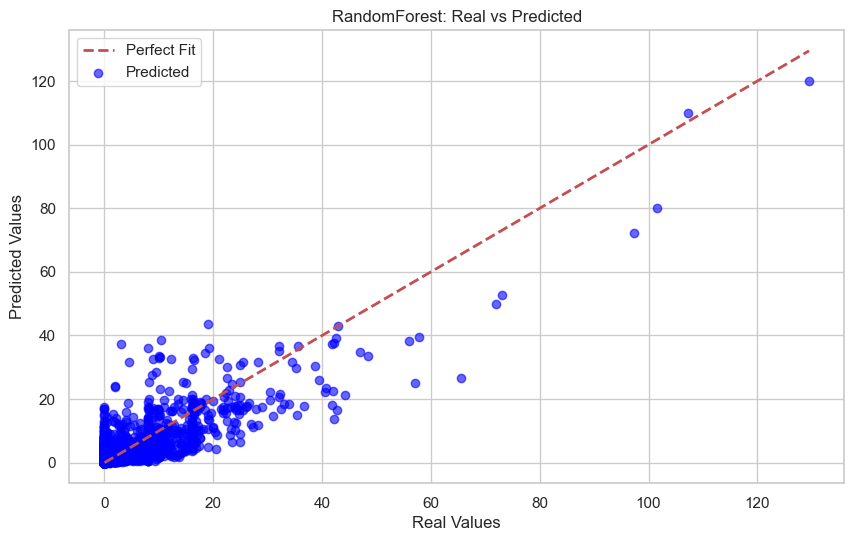

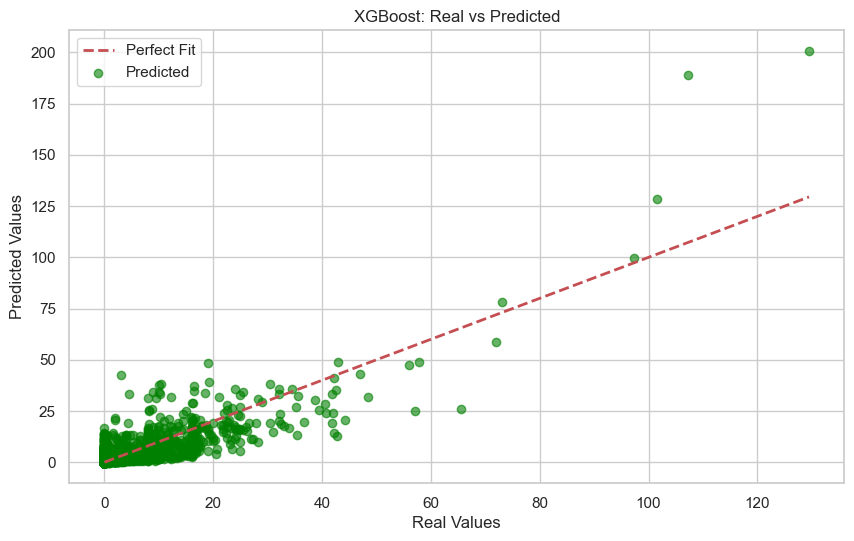

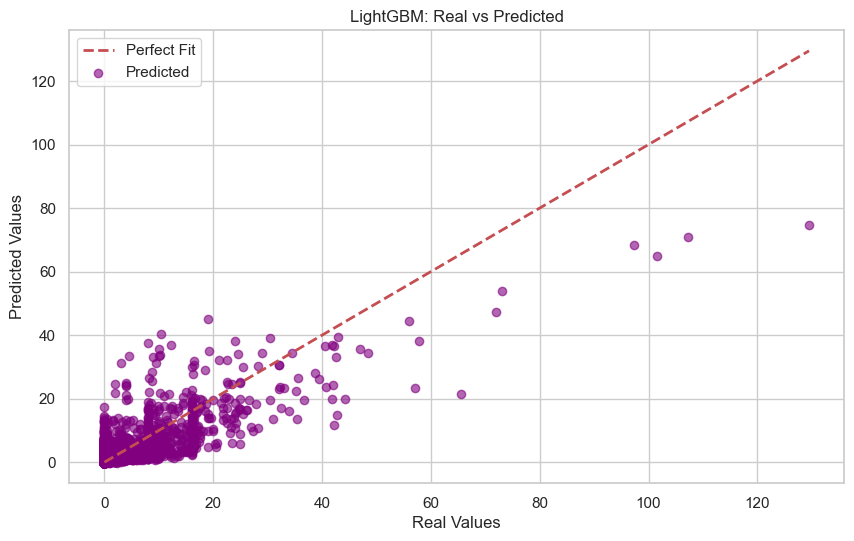

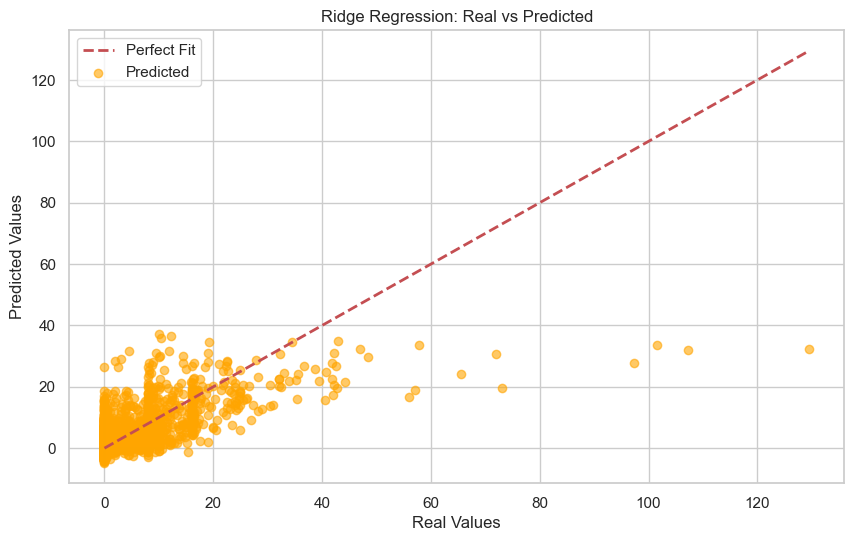

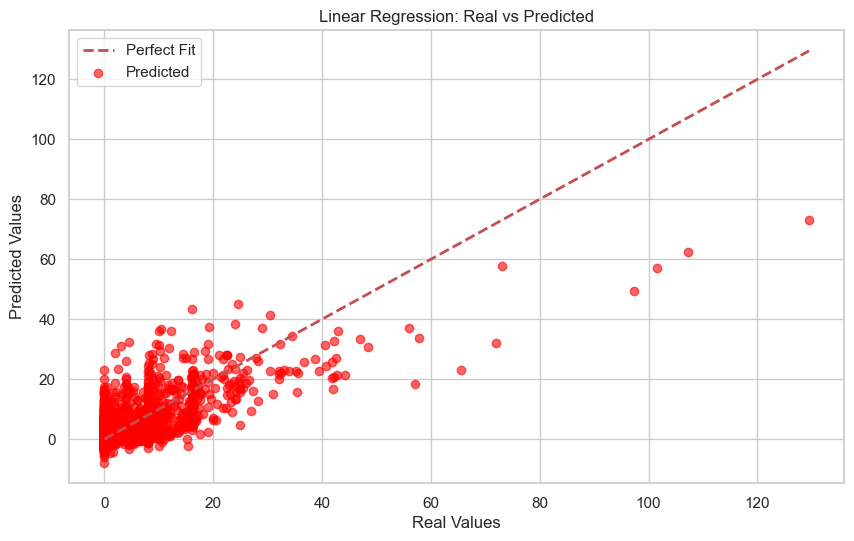

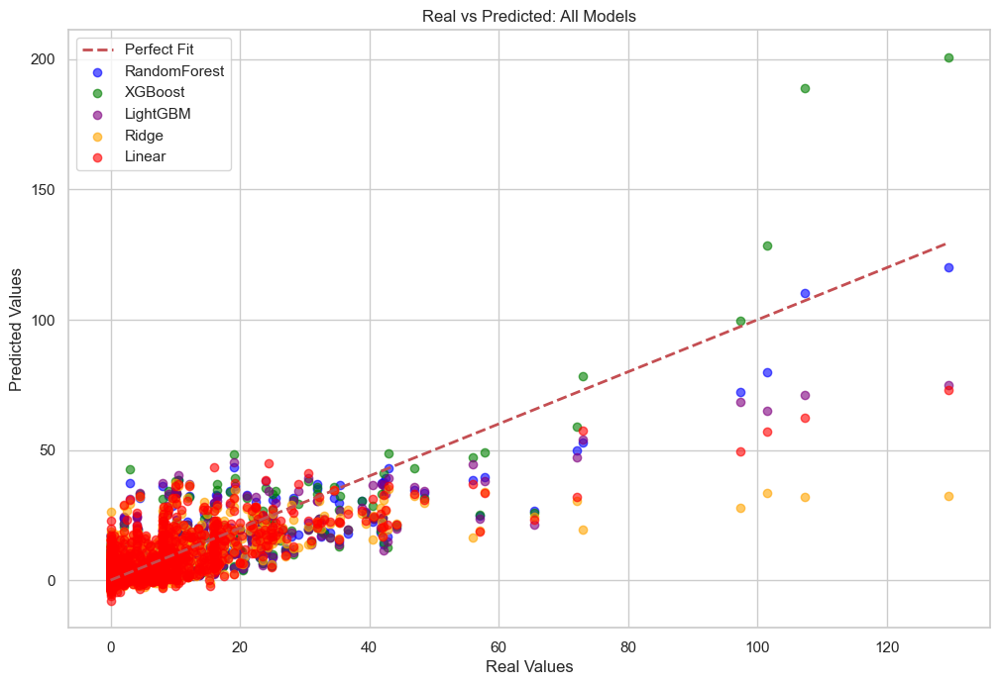

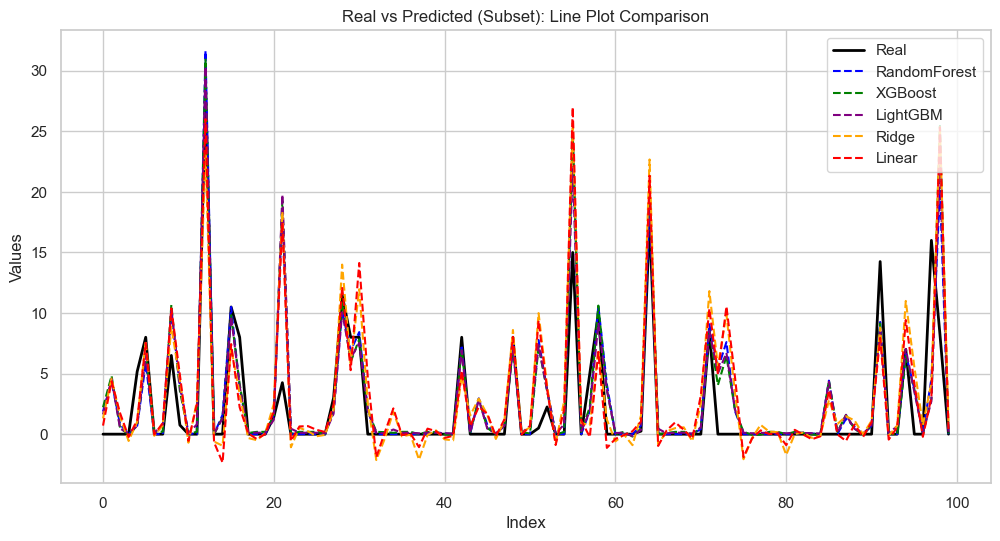

In [52]:
# Plot settings
sns.set(style="whitegrid", context="notebook")

# ----- Comparison: Real vs Predicted for RandomForest -----
plt.figure(figsize=(10, 6))
plt.scatter(y_test, preds_rf_final, alpha=0.6, label="Predicted", color="blue")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2, label="Perfect Fit")
plt.title("RandomForest: Real vs Predicted")
plt.xlabel("Real Values")
plt.ylabel("Predicted Values")
plt.legend()
plt.show()

# ----- Comparison: Real vs Predicted for XGBoost -----
plt.figure(figsize=(10, 6))
plt.scatter(y_test, preds_xgb_final, alpha=0.6, label="Predicted", color="green")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2, label="Perfect Fit")
plt.title("XGBoost: Real vs Predicted")
plt.xlabel("Real Values")
plt.ylabel("Predicted Values")
plt.legend()
plt.show()

# ----- Comparison: Real vs Predicted for LightGBM -----
plt.figure(figsize=(10, 6))
plt.scatter(y_test, preds_lgbm_final, alpha=0.6, label="Predicted", color="purple")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2, label="Perfect Fit")
plt.title("LightGBM: Real vs Predicted")
plt.xlabel("Real Values")
plt.ylabel("Predicted Values")
plt.legend()
plt.show()


# ----- Comparison: Real vs Predicted for Ridge -----
plt.figure(figsize=(10, 6))
plt.scatter(y_test, preds_ridge_final, alpha=0.6, label="Predicted", color="orange")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2, label="Perfect Fit")
plt.title("Ridge Regression: Real vs Predicted")
plt.xlabel("Real Values")
plt.ylabel("Predicted Values")
plt.legend()
plt.show()

# ----- Comparison: Real vs Predicted for Linear Regression -----
plt.figure(figsize=(10, 6))
plt.scatter(y_test, preds_linear_final, alpha=0.6, label="Predicted", color="red")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2, label="Perfect Fit")
plt.title("Linear Regression: Real vs Predicted")
plt.xlabel("Real Values")
plt.ylabel("Predicted Values")
plt.legend()
plt.show()



# ----- Combined Real vs Predicted for All Models -----
plt.figure(figsize=(12, 8))
plt.scatter(y_test, preds_rf_final, alpha=0.6, label="RandomForest", color="blue")
plt.scatter(y_test, preds_xgb_final, alpha=0.6, label="XGBoost", color="green")
plt.scatter(y_test, preds_lgbm_final, alpha=0.6, label="LightGBM", color="purple")
plt.scatter(y_test, preds_ridge_final, alpha=0.6, label="Ridge", color="orange")
plt.scatter(y_test, preds_linear_final, alpha=0.6, label="Linear", color="red")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2, label="Perfect Fit")
plt.title("Real vs Predicted: All Models")
plt.xlabel("Real Values")
plt.ylabel("Predicted Values")
plt.legend()
plt.show()






# ----- Line Plot for Real vs Predicted (Subset for Visualization) -----
# Use a subset of data for better line visualization
subset_index = slice(0, 100)  # Adjust this range as needed

plt.figure(figsize=(12, 6))
plt.plot(range(len(y_test[subset_index])), y_test[subset_index], label="Real", color="black", linewidth=2)
plt.plot(range(len(y_test[subset_index])), preds_rf_final[subset_index], label="RandomForest", color="blue", linestyle="--")
plt.plot(range(len(y_test[subset_index])), preds_xgb_final[subset_index], label="XGBoost", color="green", linestyle="--")
plt.plot(range(len(y_test[subset_index])), preds_lgbm_final[subset_index], label="LightGBM", color="purple", linestyle="--")
plt.plot(range(len(y_test[subset_index])), preds_ridge_final[subset_index], label="Ridge", color="orange", linestyle="--")
plt.plot(range(len(y_test[subset_index])), preds_linear_final[subset_index], label="Linear", color="red", linestyle="--")
plt.title("Real vs Predicted (Subset): Line Plot Comparison")
plt.xlabel("Index")
plt.ylabel("Values")
plt.legend()
plt.show()


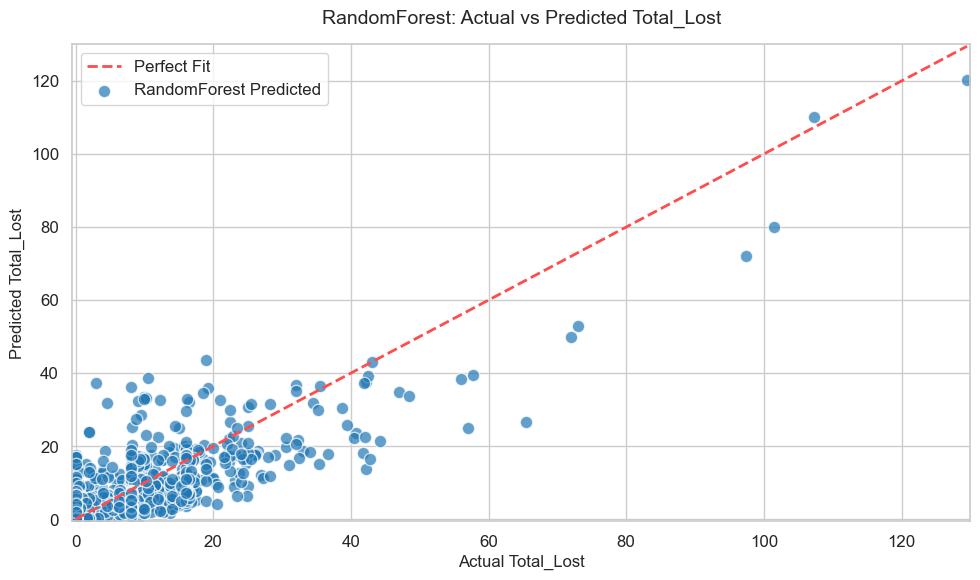

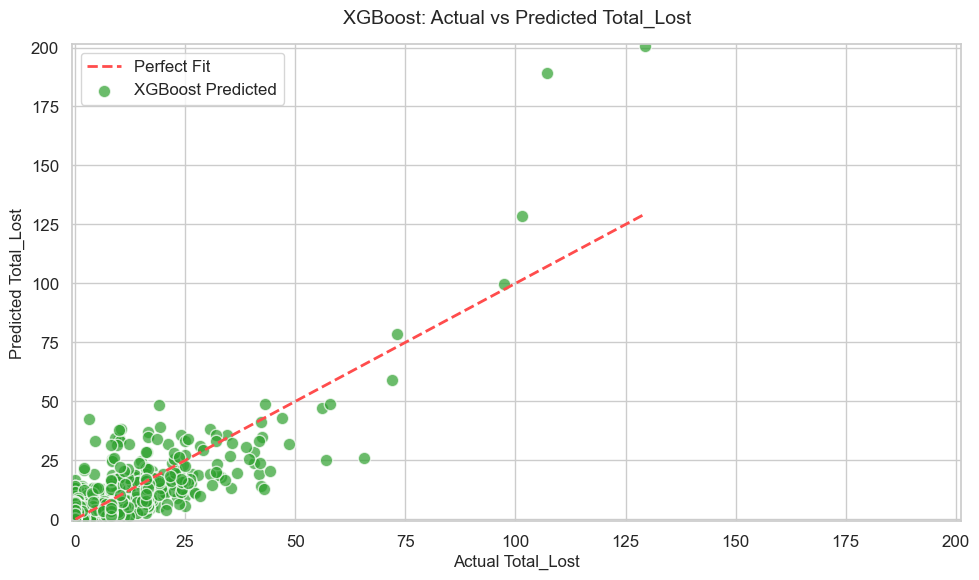

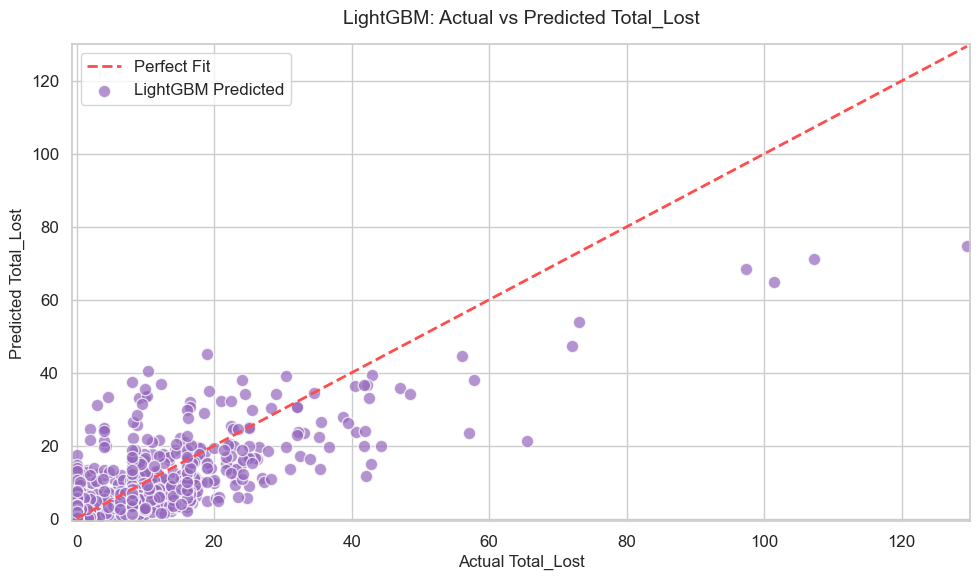

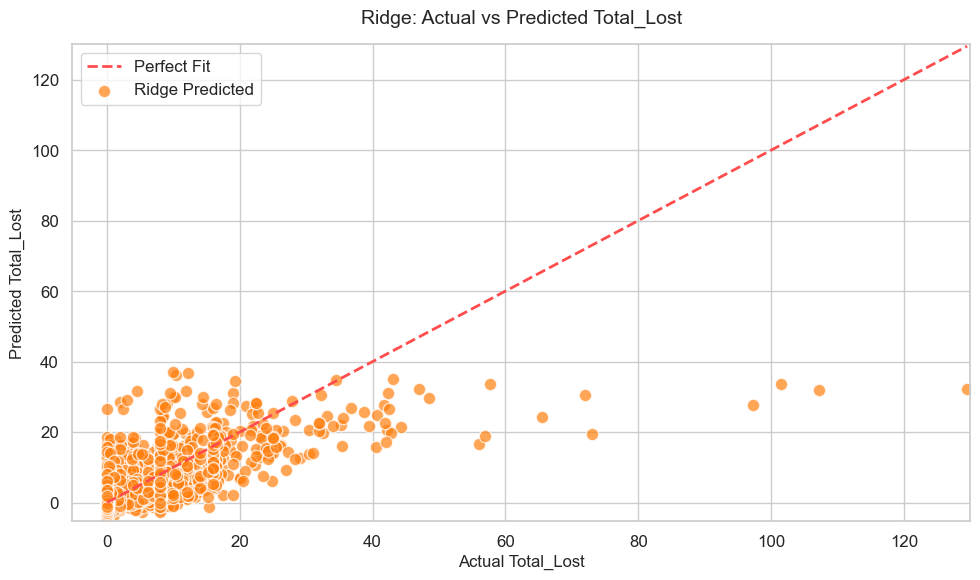

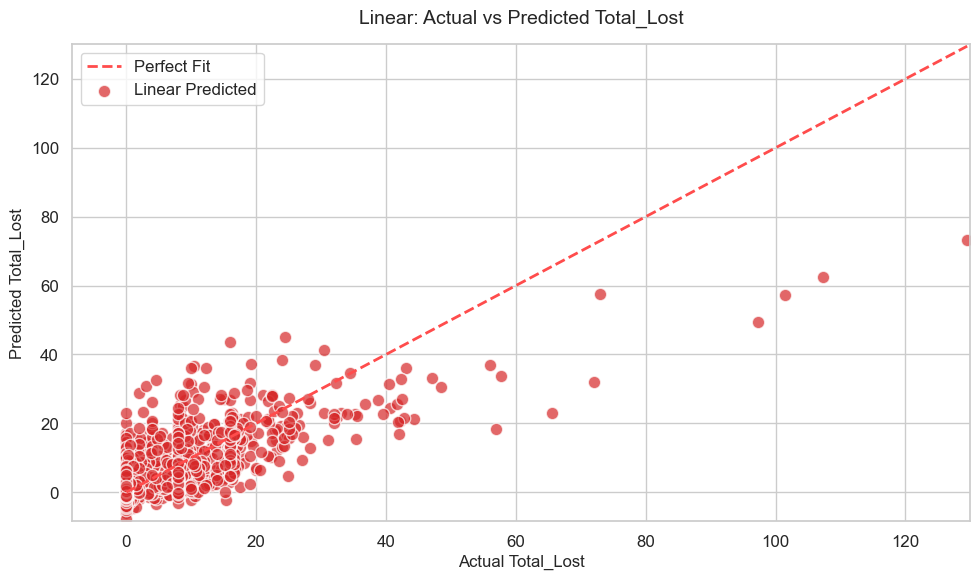

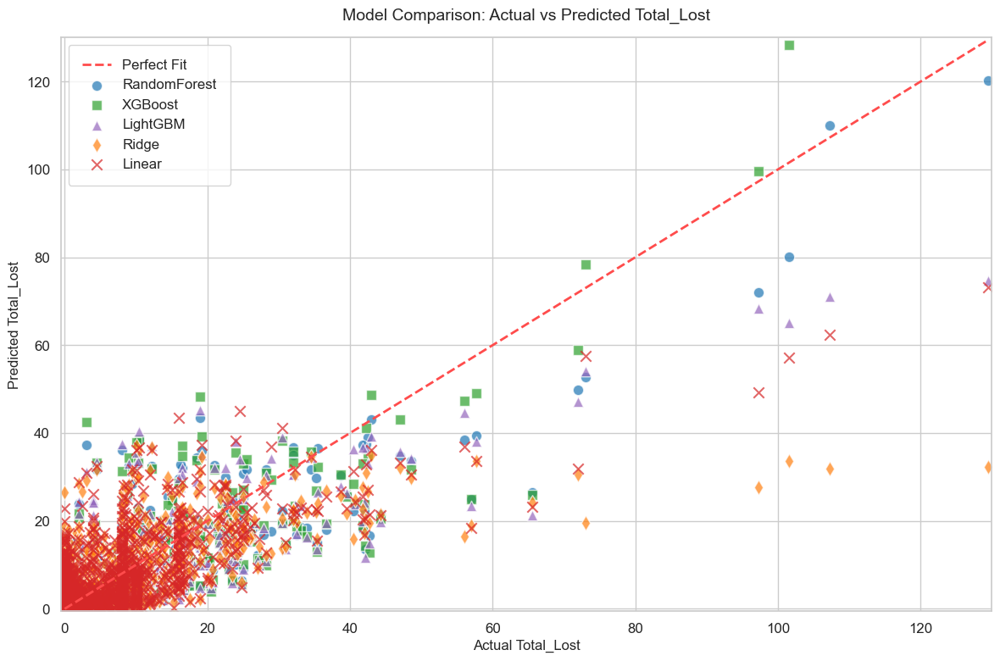

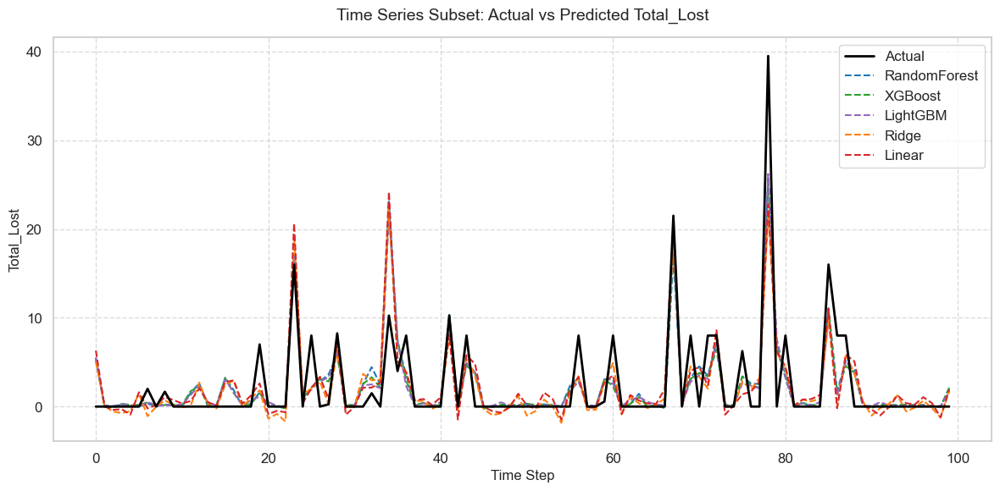

In [53]:
# Plot settings
sns.set(style="whitegrid", context="notebook", font_scale=1.1)
plt.rcParams["figure.dpi"] = 100  # High resolution

# ----- Shared Parameters -----
AXIS_LABEL_FONTSIZE = 12
TITLE_FONTSIZE = 14
PERFECT_FIT_COLOR = "#FF4C4C"
SCATTER_ALPHA = 0.7
SCATTER_EDGECOLOR = "w"  # White edges for better visibility

# ----- Individual Model Plots -----
def plot_model_comparison(y_true, y_pred, model_name, color):
    plt.figure(figsize=(10, 6))
    plt.scatter(y_true, y_pred, alpha=SCATTER_ALPHA, label=f"{model_name} Predicted", 
                color=color, edgecolor=SCATTER_EDGECOLOR, s=80)
    plt.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()], 
             linestyle='--', lw=2, color=PERFECT_FIT_COLOR, label="Perfect Fit")
    
    # Axis limits with buffer
    axis_min = min(y_true.min(), y_pred.min()) - 0.5
    axis_max = max(y_true.max(), y_pred.max()) + 0.5
    plt.xlim(axis_min, axis_max)
    plt.ylim(axis_min, axis_max)
    
    plt.title(f"{model_name}: Actual vs Predicted Total_Lost", fontsize=TITLE_FONTSIZE, pad=15)
    plt.xlabel("Actual Total_Lost", fontsize=AXIS_LABEL_FONTSIZE)
    plt.ylabel("Predicted Total_Lost", fontsize=AXIS_LABEL_FONTSIZE)
    plt.legend(loc='upper left', frameon=True, facecolor='white')
    plt.tight_layout()
    plt.show()

# Generate individual plots
plot_model_comparison(y_test, preds_rf_final, "RandomForest", "#1F77B4")  # Blue
plot_model_comparison(y_test, preds_xgb_final, "XGBoost", "#2CA02C")       # Green
plot_model_comparison(y_test, preds_lgbm_final, "LightGBM", "#9467BD")     # Purple
plot_model_comparison(y_test, preds_ridge_final, "Ridge", "#FF7F0E")       # Orange
plot_model_comparison(y_test, preds_linear_final, "Linear", "#D62728")     # Red

# ----- Combined Model Comparison -----
plt.figure(figsize=(12, 8))
# RandomForest
plt.scatter(y_test, preds_rf_final, alpha=SCATTER_ALPHA, label="RandomForest", 
           color="#1F77B4", edgecolor=SCATTER_EDGECOLOR, s=80)
# XGBoost
plt.scatter(y_test, preds_xgb_final, alpha=SCATTER_ALPHA, label="XGBoost", 
           color="#2CA02C", marker="s", edgecolor=SCATTER_EDGECOLOR, s=80)
# LightGBM
plt.scatter(y_test, preds_lgbm_final, alpha=SCATTER_ALPHA, label="LightGBM", 
           color="#9467BD", marker="^", edgecolor=SCATTER_EDGECOLOR, s=80)
# Ridge
plt.scatter(y_test, preds_ridge_final, alpha=SCATTER_ALPHA, label="Ridge", 
           color="#FF7F0E", marker="d", edgecolor=SCATTER_EDGECOLOR, s=80)
# Linear
plt.scatter(y_test, preds_linear_final, alpha=SCATTER_ALPHA, label="Linear", 
           color="#D62728", marker="x", edgecolor=SCATTER_EDGECOLOR, s=80)

plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 
         linestyle='--', lw=2, color=PERFECT_FIT_COLOR, label="Perfect Fit")

plt.title("Model Comparison: Actual vs Predicted Total_Lost", fontsize=TITLE_FONTSIZE, pad=15)
plt.xlabel("Actual Total_Lost", fontsize=AXIS_LABEL_FONTSIZE)
plt.ylabel("Predicted Total_Lost", fontsize=AXIS_LABEL_FONTSIZE)
plt.xlim(y_test.min() - 0.5, y_test.max() + 0.5)
plt.ylim(y_test.min() - 0.5, y_test.max() + 0.5)
plt.legend(loc='upper left', frameon=True, facecolor='white', borderpad=1)
plt.tight_layout()
plt.show()

# ----- Time Series Subset Comparison -----
subset_index = slice(-100, None)  # First 100 samples

plt.figure(figsize=(12, 6))
# Actual Values
plt.plot(y_test[subset_index], label="Actual", color="black", lw=2, zorder=3)
# Model Predictions
plt.plot(preds_rf_final[subset_index], label="RandomForest", color="#1F77B4", linestyle="--")
plt.plot(preds_xgb_final[subset_index], label="XGBoost", color="#2CA02C", linestyle="--")
plt.plot(preds_lgbm_final[subset_index], label="LightGBM", color="#9467BD", linestyle="--")
plt.plot(preds_ridge_final[subset_index], label="Ridge", color="#FF7F0E", linestyle="--")
plt.plot(preds_linear_final[subset_index], label="Linear", color="#D62728", linestyle="--")

plt.title("Time Series Subset: Actual vs Predicted Total_Lost", fontsize=TITLE_FONTSIZE, pad=15)
plt.xlabel("Time Step", fontsize=AXIS_LABEL_FONTSIZE)
plt.ylabel("Total_Lost", fontsize=AXIS_LABEL_FONTSIZE)
plt.legend(loc='upper right', frameon=True, facecolor='white')
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# 📊 Predicting Absenteeism from Total_Lost

The core objective of this section is to evaluate the model's performance not just in predicting **Total_Lost**, but also in its ability to predict **Absenteeism**, which is the true business metric of interest.

## 🧮 Absenteeism Formula
**Absenteeism = (Total_Lost) ÷ (Scheduled Hours)**

Where:
- **Total_Lost** = The total hours lost due to absenteeism.
- **Scheduled Hours** = The total hours an employee was scheduled to work.

## ✅ Key Objectives:
- **Assess** both **actual** and **predicted absenteeism rates**.
- **Compare** model performance using key metrics:
  - **R² (R-squared):** Measures the proportion of variance explained by the model.
  - **MSE (Mean Squared Error):** Quantifies the average squared difference between actual and predicted absenteeism.
  - **MAE (Mean Absolute Error):** Shows the average magnitude of errors in predictions.
  - **RMSE (Root Mean Squared Error):** Provides error magnitude in the same unit as absenteeism for better interpretability.


## 🎯 Why This Matters:
While **Total_Lost** predictions are essential for operational analysis, the **true business impact** lies in predicting absenteeism rates, which directly affect productivity and workforce management decisions.  
This dual evaluation ensures the model is not only technically sound but also **business-relevant**.


In [54]:
# ----- Function to Calculate Absenteeism -----
def calculate_absenteeism(total_lost, scheduled):
    with np.errstate(divide='ignore', invalid='ignore'):
        absenteeism = np.where(scheduled != 0, total_lost / scheduled, 0)
    return absenteeism

# ----- Function to Evaluate Absenteeism Predictions -----
def evaluate_absenteeism(y_true, y_pred, scheduled):
    actual_absenteeism = calculate_absenteeism(y_true, scheduled)
    predicted_absenteeism = calculate_absenteeism(y_pred, scheduled)

    r2 = r2_score(actual_absenteeism, predicted_absenteeism)
    mse = mean_squared_error(actual_absenteeism, predicted_absenteeism)
    mae = mean_absolute_error(actual_absenteeism, predicted_absenteeism)
    rmse = np.sqrt(mse)

    return actual_absenteeism, predicted_absenteeism, {'R2': r2, 'MSE': mse, 'MAE': mae, 'RMSE': rmse}

# ----- Absenteeism Evaluation -----
# DataFrame to store absenteeism metrics
absenteeism_metrics_df = pd.DataFrame()

# X_test_e_l_n_m has a 'Scheduled_Hours' column
scheduled = X_test_e_l_n_m['Scheduled_Hours'].values

# Evaluate Absenteeism for Each Model
for model_name, preds_final in {
    "RandomForest": preds_rf_final,
    "XGBoost": preds_xgb_final,
    "LightGBM": preds_lgbm_final,
    "Ridge": preds_ridge_final,
    "Linear": preds_linear_final
}.items():
    actual_abs, predicted_abs, metrics = evaluate_absenteeism(y_test, preds_final, scheduled)

    print(f"{model_name} Absenteeism Metrics: {metrics}")
    # Save metrics to DataFrame
    metrics['Model'] = model_name
    absenteeism_metrics_df = pd.concat([absenteeism_metrics_df, pd.DataFrame([metrics])], ignore_index=True)

# Display absenteeism metrics
print("\nAbsenteeism Metrics for All Models:")
print(absenteeism_metrics_df)
absenteeism_metrics_df


RandomForest Absenteeism Metrics: {'R2': 0.6313635347562159, 'MSE': 0.46429725724937054, 'MAE': 0.33156820598151593, 'RMSE': 0.6813936140362415}
XGBoost Absenteeism Metrics: {'R2': 0.5913583480561447, 'MSE': 0.5146837496662523, 'MAE': 0.34963274307913356, 'RMSE': 0.7174146288348546}
LightGBM Absenteeism Metrics: {'R2': 0.5913348902068178, 'MSE': 0.5147132948038887, 'MAE': 0.3569343215602114, 'RMSE': 0.7174352199354926}
Ridge Absenteeism Metrics: {'R2': 0.3816160481503241, 'MSE': 0.7788539654669245, 'MAE': 0.5042989899639413, 'RMSE': 0.8825270338448135}
Linear Absenteeism Metrics: {'R2': 0.4659769693147525, 'MSE': 0.6726014700992408, 'MAE': 0.4701071869393634, 'RMSE': 0.8201228384207092}

Absenteeism Metrics for All Models:
         R2       MSE       MAE      RMSE         Model
0  0.631364  0.464297  0.331568  0.681394  RandomForest
1  0.591358  0.514684  0.349633  0.717415       XGBoost
2  0.591335  0.514713  0.356934  0.717435      LightGBM
3  0.381616  0.778854  0.504299  0.882527  

,R2,MSE,MAE,RMSE,Model
0,0.631364,0.464297,0.331568,0.681394,RandomForest
1,0.591358,0.514684,0.349633,0.717415,XGBoost
2,0.591335,0.514713,0.356934,0.717435,LightGBM
3,0.381616,0.778854,0.504299,0.882527,Ridge
4,0.465977,0.672601,0.470107,0.820123,Linear
